In [1]:
!pip uninstall -y torch torchvision torchaudio
!pip install --no-cache-dir torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu126

Found existing installation: torch 2.10.0+cu128
Uninstalling torch-2.10.0+cu128:
  Successfully uninstalled torch-2.10.0+cu128
Found existing installation: torchvision 0.25.0+cu128
Uninstalling torchvision-0.25.0+cu128:
  Successfully uninstalled torchvision-0.25.0+cu128
Found existing installation: torchaudio 2.10.0+cu128
Uninstalling torchaudio-2.10.0+cu128:
  Successfully uninstalled torchaudio-2.10.0+cu128
Looking in indexes: https://download.pytorch.org/whl/cu126
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.8/289.8 MB 290.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 393.1/393.1 MB 330.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 897.7/897.7 kB 351.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.2/200.2 MB 248.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 303.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 222.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
import torch

print("torch:", torch.__version__)
print("cuda available:", torch.cuda.is_available())
print("cuda version:", torch.version.cuda)

if torch.cuda.is_available():
    print("gpu:", torch.cuda.get_device_name(0))
    print("capability:", torch.cuda.get_device_capability(0))

torch: 2.12.0+cu126
cuda available: True
cuda version: 12.6
gpu: Tesla P100-PCIE-16GB
capability: (6, 0)


### Week 4

#### Bước 1: Download dữ liệu từ Kaggle

In [3]:
import os
import shutil
import kagglehub

# Download latest version
path = kagglehub.dataset_download("jessicali9530/stanford-dogs-dataset")

print("Path to downloaded dataset files:", path)

Path to downloaded dataset files: /kaggle/input/datasets/jessicali9530/stanford-dogs-dataset


#### Bước 2:

- Khám phá xem dữ liệu có tổng bao nhiêu samples
- Khám phá xem đối với mỗi class/label (loại chó) sẽ bao gồm bao nhiêu ảnh
- Khám phá và phân phối của mỗi class/label xem có bị mất cân bằng dữ liệu không

In [4]:
import os
import matplotlib.pyplot as plt

images_path = os.path.join(path, "images", "Images")

# Lấy danh sách các class (giống chó) và số lượng ảnh mỗi class
class_names = sorted(os.listdir(images_path))
class_counts = {}
for cls in class_names:
    cls_path = os.path.join(images_path, cls)
    breed_name = cls.split("-", 1)[1]  # Bỏ prefix "nXXXXXXXX-"
    class_counts[breed_name] = len(os.listdir(cls_path))

total_samples = sum(class_counts.values())
num_classes = len(class_counts)

print(f"Tổng số samples: {total_samples}")
print(f"Tổng số classes (giống chó): {num_classes}")
print(f"Trung bình số ảnh mỗi class: {total_samples / num_classes:.1f}")
print(f"Class có ít ảnh nhất: {min(class_counts, key=class_counts.get)} ({min(class_counts.values())} ảnh)")
print(f"Class có nhiều ảnh nhất: {max(class_counts, key=class_counts.get)} ({max(class_counts.values())} ảnh)")

# Hiển thị số lượng ảnh mỗi class
print(f"\nSố lượng ảnh theo từng class:")
for breed, count in sorted(class_counts.items(), key=lambda x: x[1], reverse=True):
    print(f"  {breed}: {count}")


Tổng số samples: 20580
Tổng số classes (giống chó): 120
Trung bình số ảnh mỗi class: 171.5
Class có ít ảnh nhất: redbone (148 ảnh)
Class có nhiều ảnh nhất: Maltese_dog (252 ảnh)

Số lượng ảnh theo từng class:
  Maltese_dog: 252
  Afghan_hound: 239
  Scottish_deerhound: 232
  Pomeranian: 219
  Irish_wolfhound: 218
  Bernese_mountain_dog: 218
  Samoyed: 218
  Shih-Tzu: 214
  Great_Pyrenees: 213
  Leonberg: 210
  basenji: 209
  Tibetan_terrier: 206
  Sealyham_terrier: 202
  Airedale: 202
  EntleBucher: 202
  Saluki: 200
  pug: 200
  Lakeland_terrier: 197
  cairn: 197
  papillon: 196
  Norwegian_elkhound: 196
  Australian_terrier: 196
  chow: 196
  beagle: 195
  Newfoundland: 195
  Siberian_husky: 192
  Blenheim_spaniel: 188
  Ibizan_hound: 188
  bloodhound: 187
  whippet: 187
  Lhasa: 186
  Japanese_spaniel: 185
  Norwich_terrier: 185
  miniature_pinscher: 184
  silky_terrier: 183
  Italian_greyhound: 182
  Bedlington_terrier: 182
  Boston_bull: 182
  Pembroke: 181
  Dandie_Dinmont: 180
 

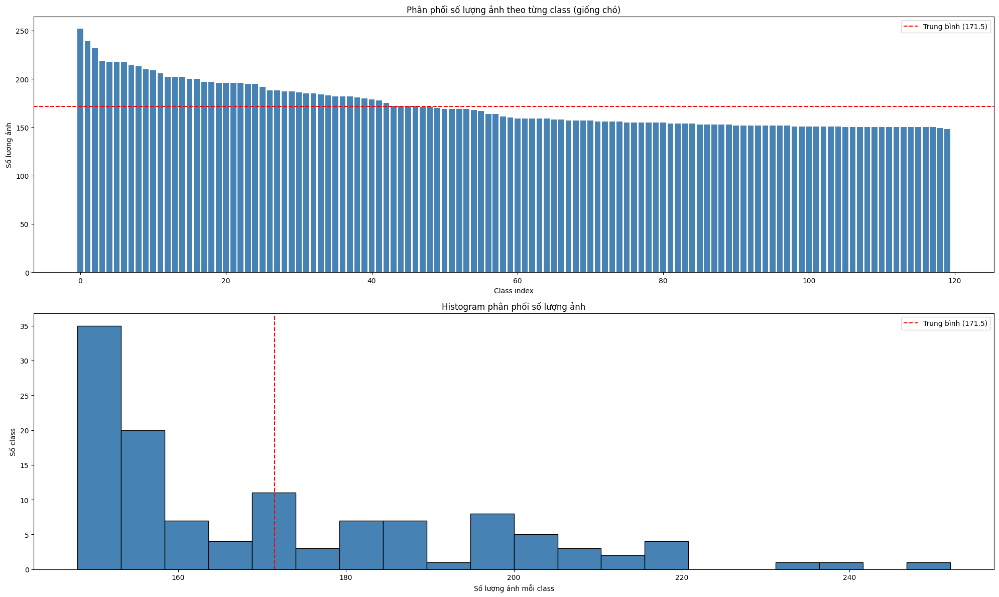


Tỷ lệ mất cân bằng (max/min): 1.70
=> Dữ liệu tương đối cân bằng giữa các class.


In [5]:
# Biểu đồ phân phối số lượng ảnh theo từng class
sorted_counts = dict(sorted(class_counts.items(), key=lambda x: x[1], reverse=True))

fig, axes = plt.subplots(2, 1, figsize=(20, 12))

# Bar chart: số lượng ảnh mỗi class
axes[0].bar(range(num_classes), sorted_counts.values(), color="steelblue")
axes[0].axhline(y=total_samples / num_classes, color="red", linestyle="--", label=f"Trung bình ({total_samples / num_classes:.1f})")
axes[0].set_xlabel("Class index")
axes[0].set_ylabel("Số lượng ảnh")
axes[0].set_title("Phân phối số lượng ảnh theo từng class (giống chó)")
axes[0].legend()

# Histogram: phân phối tần suất số lượng ảnh
axes[1].hist(class_counts.values(), bins=20, color="steelblue", edgecolor="black")
axes[1].axvline(x=total_samples / num_classes, color="red", linestyle="--", label=f"Trung bình ({total_samples / num_classes:.1f})")
axes[1].set_xlabel("Số lượng ảnh mỗi class")
axes[1].set_ylabel("Số class")
axes[1].set_title("Histogram phân phối số lượng ảnh")
axes[1].legend()

plt.tight_layout()
plt.show()

# Đánh giá mức độ mất cân bằng
imbalance_ratio = max(class_counts.values()) / min(class_counts.values())
print(f"\nTỷ lệ mất cân bằng (max/min): {imbalance_ratio:.2f}")
if imbalance_ratio < 2:
    print("=> Dữ liệu tương đối cân bằng giữa các class.")
elif imbalance_ratio < 5:
    print("=> Dữ liệu có sự mất cân bằng nhẹ giữa các class.")
else:
    print("=> Dữ liệu bị mất cân bằng nghiêm trọng giữa các class.")


#### Insights về bộ dữ liệu Stanford Dogs

**Tổng quan:**

- Bộ dữ liệu gồm 20,580 ảnh thuộc 120 giống chó khác nhau.
- Trung bình mỗi class có khoảng 171.5 ảnh.

**Phân phối dữ liệu:**

- Class nhiều nhất: Maltese_dog (252 ảnh), class ít nhất: redbone (148 ảnh).
- Tỷ lệ mất cân bằng (max/min) chỉ khoảng 1.70x → Dữ liệu tương đối cân bằng, không cần áp dụng kỹ thuật oversampling/undersampling.
- Phần lớn các class nằm trong khoảng 148–200 ảnh, chỉ một số ít class có trên 200 ảnh.

**Thách thức của bài toán Fine-grained Classification:**

- Đây là bài toán phân loại chi tiết (fine-grained) — các class có sự khác biệt rất nhỏ về ngoại hình (ví dụ: các giống terrier khác nhau rất ít).
- Với 120 class và chỉ ~170 ảnh/class, model cần học được các đặc trưng tinh tế như hình dáng tai, mõm, kết cấu lông, tỷ lệ cơ thể.
- Transfer learning từ các pretrained model (ResNet, EfficientNet, ViT...) sẽ rất quan trọng vì số lượng dữ liệu mỗi class khá hạn chế.
- Data augmentation nên được áp dụng để tăng tính đa dạng và giảm overfitting.

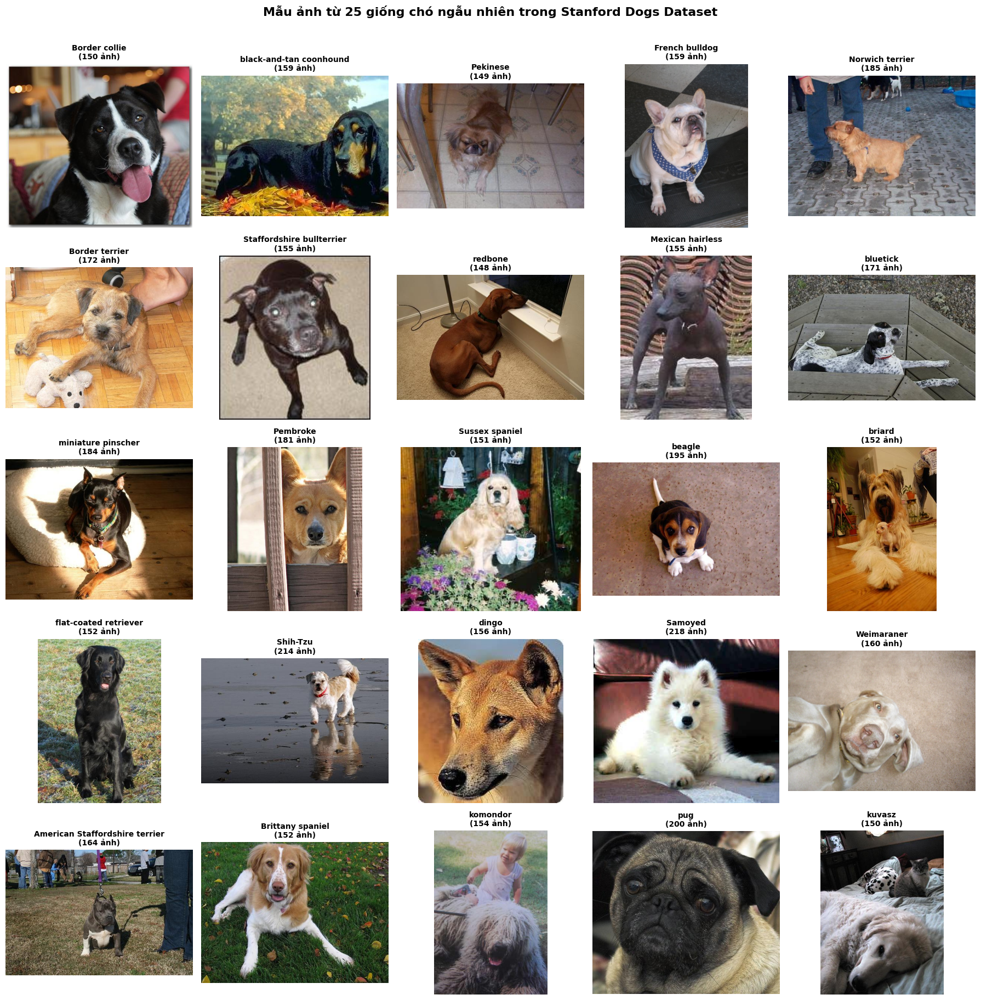

In [6]:
import random
from PIL import Image

# Chọn ngẫu nhiên 25 class để hiển thị
random.seed(42)
selected_classes = random.sample(class_names, 25)

fig, axes = plt.subplots(5, 5, figsize=(18, 18))

for idx, cls in enumerate(selected_classes):
    row, col = idx // 5, idx % 5
    cls_path = os.path.join(images_path, cls)

    # Chọn ngẫu nhiên 1 ảnh từ class
    img_name = random.choice(os.listdir(cls_path))
    img_path = os.path.join(cls_path, img_name)
    img = Image.open(img_path).convert("RGB")

    breed_name = cls.split("-", 1)[1].replace("_", " ")
    count = class_counts[cls.split("-", 1)[1]]

    axes[row, col].imshow(img)
    axes[row, col].set_title(f"{breed_name}\n({count} ảnh)", fontsize=10, fontweight="bold")
    axes[row, col].axis("off")

plt.suptitle("Mẫu ảnh từ 25 giống chó ngẫu nhiên trong Stanford Dogs Dataset", fontsize=16, fontweight="bold", y=1.01)
plt.tight_layout()
plt.show()

### Week 5

Notebook này tiếp nối **week4** và tập trung vào 4 mục tiêu:

- chuẩn hóa đường dẫn dữ liệu và annotation
- tạo manifest để quản lý sample/class/bbox
- chia train/val/test theo hướng stratified
- xây dựng PyTorch Dataset + DataLoader + augmentation cho bài toán fine-grained dog classification

#### Bước 1: Chuẩn bị môi trường

- Dataset được kỳ vọng nằm dưới /kaggle/input/datasets/jessicali9530/stanford-dogs-dataset
- Notebook này dùng PyTorch Dataset tùy biến thay vì ImageFolder để hỗ trợ crop theo bounding box
- Nếu máy chưa có PyTorch, có thể cài trước bằng: `uv add torch torchvision`

In [7]:
from __future__ import annotations

import json
import random
import xml.etree.ElementTree as ET
from collections import Counter, defaultdict
from functools import lru_cache
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

try:
    import torch
    from torch.utils.data import DataLoader, Dataset
    from torchvision import transforms
    from torchvision.transforms import InterpolationMode
except ImportError as exc:
    raise ImportError(
        "Notebook này cần torch và torchvision. Gợi ý cài đặt: uv add torch torchvision"
    ) from exc

In [8]:
DATASET_ROOT = Path("/kaggle/input/datasets/jessicali9530/stanford-dogs-dataset")

IMAGE_SIZE = 224
TRAIN_RATIO = 0.70
VAL_RATIO = 0.15
TEST_RATIO = 0.15

BATCH_SIZE = 32
NUM_WORKERS = 0  # giữ 0 để notebook dễ chạy trên mọi môi trường
RANDOM_SEED = 42

USE_BBOX = False
BBOX_PADDING = 0.05

ARTIFACTS_DIR = Path("./artifacts/datasets")
ARTIFACTS_DIR.mkdir(parents=True, exist_ok=True)


def find_first_existing(candidates: list[Path]) -> Path:
    for candidate in candidates:
        if candidate.exists():
            return candidate
    raise FileNotFoundError(
        "Không tìm thấy thư mục ảnh/annotation. "
        f"Đã thử: {[str(path) for path in candidates]}"
    )


IMAGES_ROOT = find_first_existing(
    [
        DATASET_ROOT / "images" / "Images",
        DATASET_ROOT / "images" / "Images",
    ]
)

ANNOTATIONS_ROOT = find_first_existing(
    [
        DATASET_ROOT / "annotations" / "Annotation",
        DATASET_ROOT / "annotations" / "Annotation",
    ]
)

assert abs(TRAIN_RATIO + VAL_RATIO + TEST_RATIO - 1.0) < 1e-8

print(f"Images root     : {IMAGES_ROOT}")
print(f"Annotations root: {ANNOTATIONS_ROOT}")
print(f"Artifacts dir   : {ARTIFACTS_DIR.resolve()}")

Images root     : /kaggle/input/datasets/jessicali9530/stanford-dogs-dataset/images/Images
Annotations root: /kaggle/input/datasets/jessicali9530/stanford-dogs-dataset/annotations/Annotation
Artifacts dir   : /kaggle/working/artifacts/datasets


In [9]:
def seed_everything(seed: int = 42) -> None:
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)


def breed_display_name(class_folder: str) -> str:
    return class_folder.split("-", 1)[1].replace("_", " ")


@lru_cache(maxsize=None)
def parse_annotation(annotation_path: str) -> dict:
    root = ET.parse(annotation_path).getroot()

    size_node = root.find("size")
    object_node = root.find("object")
    bbox_node = object_node.find("bndbox")

    bbox = {
        "xmin": int(bbox_node.findtext("xmin")),
        "ymin": int(bbox_node.findtext("ymin")),
        "xmax": int(bbox_node.findtext("xmax")),
        "ymax": int(bbox_node.findtext("ymax")),
    }

    return {
        "width": int(size_node.findtext("width")),
        "height": int(size_node.findtext("height")),
        "bbox": bbox,
    }


def build_manifest(images_root: Path, annotations_root: Path) -> tuple[list[dict], dict[str, int]]:
    class_folders = sorted(path.name for path in images_root.iterdir() if path.is_dir())
    class_to_idx = {class_folder: idx for idx, class_folder in enumerate(class_folders)}

    records: list[dict] = []

    for class_folder in class_folders:
        image_dir = images_root / class_folder
        annotation_dir = annotations_root / class_folder

        for image_path in sorted(image_dir.glob("*.jpg")):
            annotation_path = annotation_dir / image_path.stem
            if not annotation_path.exists():
                raise FileNotFoundError(f"Thiếu annotation cho ảnh: {image_path}")

            records.append(
                {
                    "image_path": str(image_path),
                    "annotation_path": str(annotation_path),
                    "class_folder": class_folder,
                    "breed_name": breed_display_name(class_folder),
                    "class_id": class_to_idx[class_folder],
                }
            )

    return records, class_to_idx


def crop_with_bbox(image: Image.Image, bbox: dict, padding_ratio: float = 0.0) -> Image.Image:
    xmin, ymin, xmax, ymax = bbox["xmin"], bbox["ymin"], bbox["xmax"], bbox["ymax"]
    box_width = xmax - xmin
    box_height = ymax - ymin

    pad_x = int(box_width * padding_ratio)
    pad_y = int(box_height * padding_ratio)

    xmin = max(0, xmin - pad_x)
    ymin = max(0, ymin - pad_y)
    xmax = min(image.width, xmax + pad_x)
    ymax = min(image.height, ymax + pad_y)

    return image.crop((xmin, ymin, xmax, ymax))


seed_everything(RANDOM_SEED)

#### Bước 2: Tạo manifest dữ liệu

Ở bước này, mỗi sample sẽ được quy về một record thống nhất gồm:

- image_path
- annotation_path
- class_folder
- breed_name
- class_id

In [10]:
records, class_to_idx = build_manifest(IMAGES_ROOT, ANNOTATIONS_ROOT)
idx_to_class = {idx: class_folder for class_folder, idx in class_to_idx.items()}
class_counts = Counter(record["class_folder"] for record in records)

print(f"Tổng số samples: {len(records):,}")
print(f"Tổng số classes: {len(class_to_idx)}")
print(f"Class ít ảnh nhất: {min(class_counts.values())}")
print(f"Class nhiều ảnh nhất: {max(class_counts.values())}")
print(f"Tỷ lệ max/min: {max(class_counts.values()) / min(class_counts.values()):.2f}")

sample_record = records[0].copy()
sample_record["annotation_preview"] = parse_annotation(sample_record["annotation_path"])
print(json.dumps(sample_record, indent=2, ensure_ascii=False))

Tổng số samples: 20,580
Tổng số classes: 120
Class ít ảnh nhất: 148
Class nhiều ảnh nhất: 252
Tỷ lệ max/min: 1.70
{
  "image_path": "/kaggle/input/datasets/jessicali9530/stanford-dogs-dataset/images/Images/n02085620-Chihuahua/n02085620_10074.jpg",
  "annotation_path": "/kaggle/input/datasets/jessicali9530/stanford-dogs-dataset/annotations/Annotation/n02085620-Chihuahua/n02085620_10074",
  "class_folder": "n02085620-Chihuahua",
  "breed_name": "Chihuahua",
  "class_id": 0,
  "annotation_preview": {
    "width": 333,
    "height": 500,
    "bbox": {
      "xmin": 25,
      "ymin": 10,
      "xmax": 276,
      "ymax": 498
    }
  }
}


#### Bước 3: Chia train/val/test theo class

Vì bài toán phân loại có 120 class, split nên được thực hiện theo từng class để tránh lệch phân phối giữa các tập.

In [11]:
def stratified_split_records(
    records: list[dict],
    train_ratio: float = 0.70,
    val_ratio: float = 0.15,
    test_ratio: float = 0.15,
    seed: int = 42,
) -> dict[str, list[dict]]:
    assert abs(train_ratio + val_ratio + test_ratio - 1.0) < 1e-8

    grouped_records: dict[int, list[dict]] = defaultdict(list)
    for record in records:
        grouped_records[record["class_id"]].append(record)

    rng = random.Random(seed)
    splits = {"train": [], "val": [], "test": []}

    for _, items in grouped_records.items():
        items = items.copy()
        rng.shuffle(items)

        n_total = len(items)
        n_train = int(n_total * train_ratio)
        n_val = int(n_total * val_ratio)
        n_test = n_total - n_train - n_val

        if min(n_train, n_val, n_test) <= 0:
            raise ValueError("Một class không đủ samples để chia train/val/test.")

        splits["train"].extend(items[:n_train])
        splits["val"].extend(items[n_train:n_train + n_val])
        splits["test"].extend(items[n_train + n_val:])

    for split_records in splits.values():
        rng.shuffle(split_records)

    return splits


def summarize_split(split_name: str, split_records: list[dict]) -> None:
    counts = Counter(record["class_id"] for record in split_records)
    print(
        f"{split_name:<5} | samples={len(split_records):5d} | "
        f"classes={len(counts):3d} | min/class={min(counts.values()):3d} | "
        f"max/class={max(counts.values()):3d}"
    )


splits = stratified_split_records(
    records,
    train_ratio=TRAIN_RATIO,
    val_ratio=VAL_RATIO,
    test_ratio=TEST_RATIO,
    seed=RANDOM_SEED,
)

for split_name, split_records in splits.items():
    summarize_split(split_name, split_records)

with (ARTIFACTS_DIR / "class_to_idx.json").open("w", encoding="utf-8") as handle:
    json.dump(class_to_idx, handle, ensure_ascii=False, indent=2)

for split_name, split_records in splits.items():
    output_path = ARTIFACTS_DIR / f"{split_name}_records.json"
    with output_path.open("w", encoding="utf-8") as handle:
        json.dump(split_records, handle, ensure_ascii=False, indent=2)

print(f"Đã lưu split manifests vào: {ARTIFACTS_DIR.resolve()}")

train | samples=14355 | classes=120 | min/class=103 | max/class=176
val   | samples= 3025 | classes=120 | min/class= 22 | max/class= 37
test  | samples= 3200 | classes=120 | min/class= 23 | max/class= 39
Đã lưu split manifests vào: /kaggle/working/artifacts/datasets


#### Bước 4: Định nghĩa preprocessing và augmentation

Gợi ý baseline:

- `train_transform`: augmentation vừa phải để tránh làm mất đặc trưng fine-grained
- `eval_transform`: resize + center crop ổn định để đánh giá

In [12]:
IMAGENET_MEAN = (0.485, 0.456, 0.406)
IMAGENET_STD = (0.229, 0.224, 0.225)

train_transform = transforms.Compose(
    [
        transforms.RandomResizedCrop(
            IMAGE_SIZE,
            scale=(0.70, 1.0),
            ratio=(0.80, 1.25),
            interpolation=InterpolationMode.BICUBIC,
        ),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomApply(
            [
                transforms.ColorJitter(
                    brightness=0.15,
                    contrast=0.15,
                    saturation=0.15,
                    hue=0.02,
                )
            ],
            p=0.8,
        ),
        transforms.RandomRotation(
            degrees=10,
            interpolation=InterpolationMode.BICUBIC,
        ),
        transforms.ToTensor(),
        transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
        # transforms.RandomErasing(p=0.25, scale=(0.02, 0.10)),
    ]
)

eval_transform = transforms.Compose(
    [
        transforms.Resize(int(IMAGE_SIZE * 256 / 224), interpolation=InterpolationMode.BICUBIC),
        transforms.CenterCrop(IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ]
)

print(train_transform)
print()
print(eval_transform)

Compose(
    RandomResizedCrop(size=(224, 224), scale=(0.7, 1.0), ratio=(0.8, 1.25), interpolation=bicubic, antialias=True)
    RandomHorizontalFlip(p=0.5)
    RandomApply(
    p=0.8
    ColorJitter(brightness=(0.85, 1.15), contrast=(0.85, 1.15), saturation=(0.85, 1.15), hue=(-0.02, 0.02))
)
    RandomRotation(degrees=[-10.0, 10.0], interpolation=bicubic, expand=False, fill=0)
    ToTensor()
    Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
)

Compose(
    Resize(size=256, interpolation=bicubic, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    ToTensor()
    Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
)


#### Bước 5: Custom PyTorch Dataset
Điểm chính của dataset tùy biến:

- đọc từ manifest đã tạo
- có thể bật/tắt bbox crop bằng USE_BBOX
- tái sử dụng cùng một cấu trúc cho train/val/test

In [13]:
class StanfordDogsDataset(Dataset):
    def __init__(
        self,
        records: list[dict],
        transform=None,
        use_bbox: bool = False,
        bbox_padding: float = 0.0,
        return_metadata: bool = False,
    ) -> None:
        self.records = list(records)
        self.transform = transform
        self.use_bbox = use_bbox
        self.bbox_padding = bbox_padding
        self.return_metadata = return_metadata

    def __len__(self) -> int:
        return len(self.records)

    def __getitem__(self, index: int):
        record = self.records[index]

        with Image.open(record["image_path"]) as pil_image:
            image = pil_image.convert("RGB")

        if self.use_bbox:
            annotation = parse_annotation(record["annotation_path"])
            image = crop_with_bbox(
                image,
                annotation["bbox"],
                padding_ratio=self.bbox_padding,
            )

        if self.transform is not None:
            image = self.transform(image)

        label = record["class_id"]

        if self.return_metadata:
            return image, label, record
        return image, label

#### Bước 6: Tạo DataLoader

In [14]:
train_dataset = StanfordDogsDataset(
    splits["train"],
    transform=train_transform,
    use_bbox=USE_BBOX,
    bbox_padding=BBOX_PADDING,
)

val_dataset = StanfordDogsDataset(
    splits["val"],
    transform=eval_transform,
    use_bbox=USE_BBOX,
    bbox_padding=BBOX_PADDING,
)

test_dataset = StanfordDogsDataset(
    splits["test"],
    transform=eval_transform,
    use_bbox=USE_BBOX,
    bbox_padding=BBOX_PADDING,
)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=torch.cuda.is_available(),
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=torch.cuda.is_available(),
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=torch.cuda.is_available(),
)

print(f"Train samples: {len(train_dataset)}")
print(f"Val samples  : {len(val_dataset)}")
print(f"Test samples : {len(test_dataset)}")

Train samples: 14355
Val samples  : 3025
Test samples : 3200


#### Bước 7: Sanity check
Trước khi train, luôn nên kiểm tra:

- shape của batch
- kiểu dữ liệu tensor
- ảnh sau augmentation có còn hợp lý hay không

In [15]:
images, labels = next(iter(train_loader))

print(f"Batch images shape: {tuple(images.shape)}")
print(f"Batch labels shape: {tuple(labels.shape)}")
print(f"Labels mẫu        : {labels[:8].tolist()}")
print(f"Tensor dtype      : {images.dtype}")
print(f"Min/Max normalize : {images.min().item():.3f} / {images.max().item():.3f}")

Batch images shape: (32, 3, 224, 224)
Batch labels shape: (32,)
Labels mẫu        : [67, 30, 83, 32, 80, 20, 37, 101]
Tensor dtype      : torch.float32
Min/Max normalize : -2.118 / 2.640


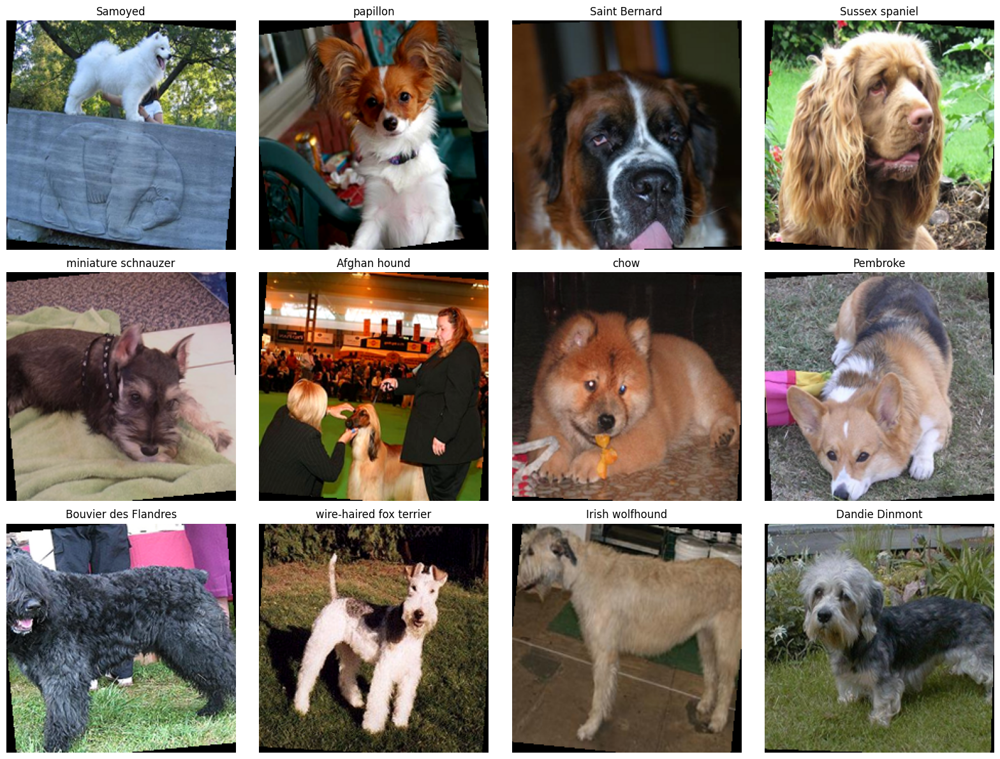

In [16]:
def denormalize_image(image_tensor: torch.Tensor) -> np.ndarray:
    mean = torch.tensor(IMAGENET_MEAN).view(3, 1, 1)
    std = torch.tensor(IMAGENET_STD).view(3, 1, 1)

    image = image_tensor.detach().cpu() * std + mean
    image = image.clamp(0.0, 1.0)
    return image.permute(1, 2, 0).numpy()


def show_batch(
    images: torch.Tensor,
    labels: torch.Tensor,
    idx_to_class: dict[int, str],
    max_items: int = 12,
    cols: int = 4,
) -> None:
    n_items = min(max_items, len(images))
    rows = int(np.ceil(n_items / cols))

    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    axes = np.array(axes).reshape(-1)

    for ax in axes:
        ax.axis("off")

    for idx in range(n_items):
        ax = axes[idx]
        ax.imshow(denormalize_image(images[idx]))
        class_folder = idx_to_class[int(labels[idx])]
        ax.set_title(breed_display_name(class_folder))

    plt.tight_layout()
    plt.show()


images, labels = next(iter(train_loader))
show_batch(images, labels, idx_to_class)

#### Bước 8: So sánh ảnh gốc và ảnh crop theo bounding box
Cell này hữu ích khi muốn quyết định có nên bật USE_BBOX=True hay không.

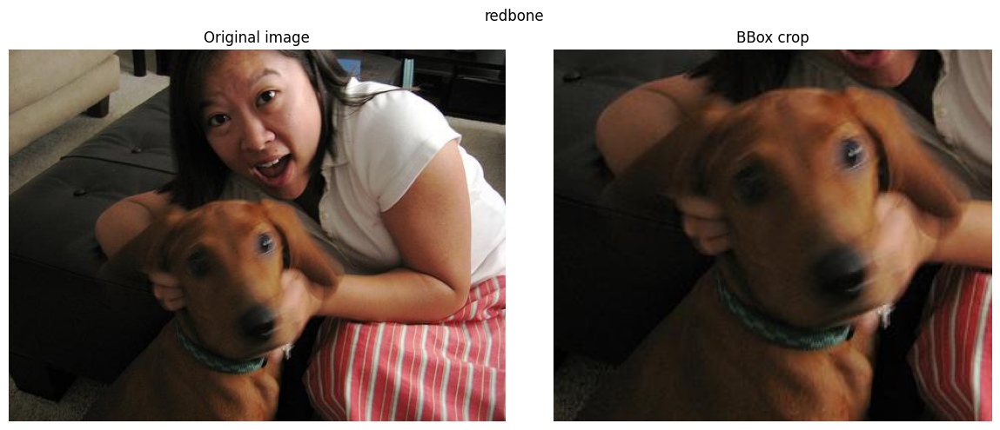

{
  "width": 500,
  "height": 375,
  "bbox": {
    "xmin": 72,
    "ymin": 137,
    "xmax": 339,
    "ymax": 373
  }
}


In [17]:
comparison_record = random.choice(splits["train"])

with Image.open(comparison_record["image_path"]) as pil_image:
    original_image = pil_image.convert("RGB")

annotation = parse_annotation(comparison_record["annotation_path"])
cropped_image = crop_with_bbox(
    original_image,
    annotation["bbox"],
    padding_ratio=BBOX_PADDING,
)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

axes[0].imshow(original_image)
axes[0].set_title("Original image")
axes[0].axis("off")

axes[1].imshow(cropped_image)
axes[1].set_title("BBox crop")
axes[1].axis("off")

plt.suptitle(comparison_record["breed_name"])
plt.tight_layout()
plt.show()

print(json.dumps(annotation, indent=2, ensure_ascii=False))

#### Bước 9: Visualize augmented images và annotation

Block này giúp kiểm tra augmentation trên cùng một sample.

- Ảnh đầu tiên: ảnh gốc với bounding box từ annotation XML
- Ảnh thứ hai: ảnh đầu vào thực sự được đưa vào pipeline augmentation
- Các ảnh còn lại: nhiều phiên bản augmented từ cùng một sample

Lưu ý: với pipeline hiện tại, bounding box chỉ được giữ chính xác trên ảnh gốc. Nếu muốn vẽ bbox đúng tuyệt đối sau RandomResizedCrop hoặc RandomRotation, cần chuyển sang transform đồng bộ cho cả image và bbox.

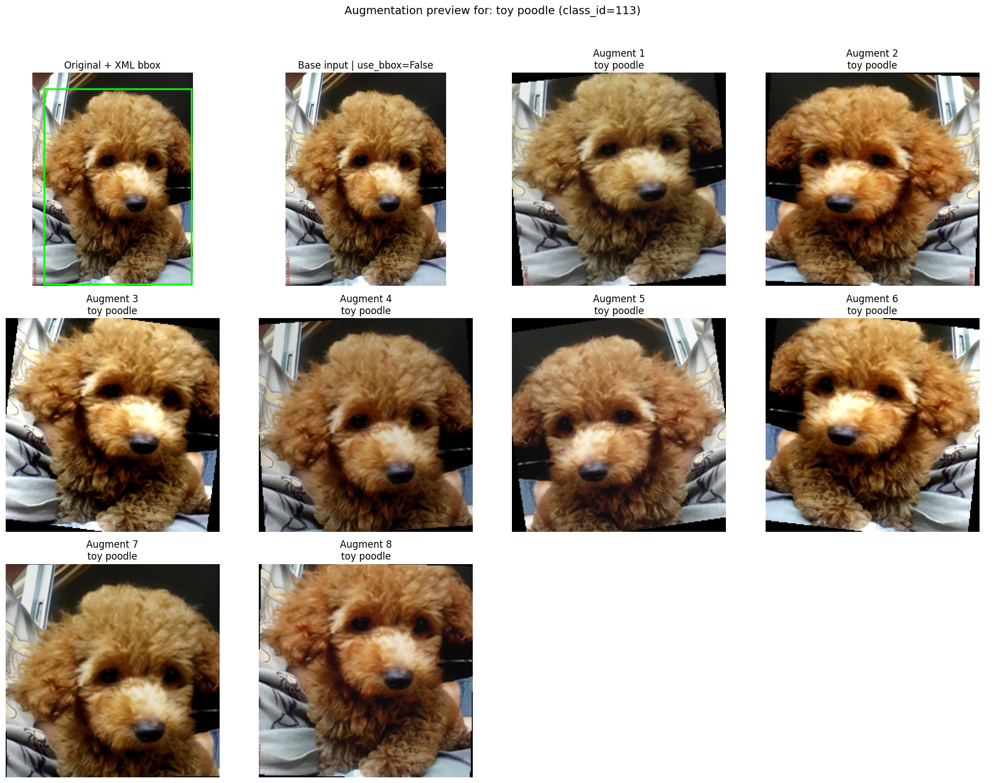

{
  "breed_name": "toy poodle",
  "class_id": 113,
  "image_path": "/kaggle/input/datasets/jessicali9530/stanford-dogs-dataset/images/Images/n02113624-toy_poodle/n02113624_1801.jpg",
  "use_bbox": false,
  "bbox_padding": 0.05,
  "annotation": {
    "width": 375,
    "height": 500,
    "bbox": {
      "xmin": 26,
      "ymin": 38,
      "xmax": 373,
      "ymax": 498
    }
  }
}


In [18]:
from math import ceil
from PIL import ImageDraw


def draw_bbox_on_image(
    image: Image.Image,
    bbox: dict,
    color: str = "lime",
    width: int = 4,
) -> Image.Image:
    canvas = image.copy()
    drawer = ImageDraw.Draw(canvas)
    drawer.rectangle(
        [
            bbox["xmin"],
            bbox["ymin"],
            bbox["xmax"],
            bbox["ymax"],
        ],
        outline=color,
        width=width,
    )
    return canvas


def get_base_image_for_augmentation(
    record: dict,
    use_bbox: bool = False,
    bbox_padding: float = 0.0,
) -> tuple[Image.Image, dict]:
    with Image.open(record["image_path"]) as pil_image:
        original_image = pil_image.convert("RGB")

    annotation = parse_annotation(record["annotation_path"])
    base_image = original_image

    if use_bbox:
        base_image = crop_with_bbox(
            original_image,
            annotation["bbox"],
            padding_ratio=bbox_padding,
        )

    return base_image, annotation


def visualize_augmented_samples(
    record: dict,
    transform,
    n_augments: int = 6,
    use_bbox: bool = False,
    bbox_padding: float = 0.0,
) -> None:
    with Image.open(record["image_path"]) as pil_image:
        original_image = pil_image.convert("RGB")

    annotation = parse_annotation(record["annotation_path"])
    original_with_bbox = draw_bbox_on_image(original_image, annotation["bbox"])
    base_image, _ = get_base_image_for_augmentation(
        record,
        use_bbox=use_bbox,
        bbox_padding=bbox_padding,
    )

    total_panels = 2 + n_augments
    cols = 4
    rows = ceil(total_panels / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(4.5 * cols, 4.5 * rows))
    axes = np.array(axes).reshape(-1)

    for ax in axes:
        ax.axis("off")

    axes[0].imshow(original_with_bbox)
    axes[0].set_title("Original + XML bbox")

    axes[1].imshow(base_image)
    axes[1].set_title(f"Base input | use_bbox={use_bbox}")

    for idx in range(n_augments):
        augmented_tensor = transform(base_image.copy())
        axes[idx + 2].imshow(denormalize_image(augmented_tensor))
        axes[idx + 2].set_title(
            f"Augment {idx + 1}\n{record['breed_name']}"
        )

    plt.suptitle(
        f"Augmentation preview for: {record['breed_name']} (class_id={record['class_id']})",
        fontsize=14,
        y=1.02,
    )
    plt.tight_layout()
    plt.show()

    annotation_summary = {
        "breed_name": record["breed_name"],
        "class_id": record["class_id"],
        "image_path": record["image_path"],
        "use_bbox": use_bbox,
        "bbox_padding": bbox_padding,
        "annotation": annotation,
    }
    print(json.dumps(annotation_summary, indent=2, ensure_ascii=False))


sample_record = random.choice(splits["train"])
visualize_augmented_samples(
    sample_record,
    transform=train_transform,
    n_augments=8,
    use_bbox=USE_BBOX,
    bbox_padding=BBOX_PADDING,
)

#### Gợi ý bước tiếp theo

- Chạy baseline với USE_BBOX=False
- Chạy baseline thứ hai với USE_BBOX=True
- Giữ nguyên split để so sánh công bằng giữa các cấu hình augmentation
- Ở notebook train kế tiếp, chỉ cần tái sử dụng train_loader, val_loader, test_loader

### Week 6-7: AlexNet

Notebook này tiếp nối week5 và tập trung vào:

- tải lại train/val/test manifests đã lưu ở tuần 5
- định nghĩa PyTorch Dataset cho Stanford Dogs
- implement AlexNet bằng torch.nn.Module
- train model từ random initialization
- theo dõi loss, top-1, top-5
- đánh giá tập test và lưu checkpoint tốt nhất

##### Week 5: Nguồn tham khảo kiến trúc

Tôi đã đối chiếu kiến trúc từ 2 nguồn chính:

- Paper gốc AlexNet: https://papers.nips.cc/paper/4824-imagenet-classification-with-deep-convolutional-neural-network
- Mã nguồn AlexNet chính thức của torchvision: https://docs.pytorch.org/vision/2.0/_modules/torchvision/models/alexnet.html

Ghi chú thực dụng:

- Paper gốc mô tả AlexNet với 5 convolution layers và 3 fully-connected layers ở phần classifier.
- torchvision cung cấp biến thể single-GPU ổn định hơn để huấn luyện trong PyTorch hiện đại.
- Notebook này tự implement model, nhưng follow topology thực dụng của torchvision: 64 -> 192 -> 384 -> 256 -> 256, AdaptiveAvgPool2d((6, 6)), dropout=0.5.
- Đây là một suy luận triển khai dựa trên nguồn chính thức: ưu tiên tính tương thích với input 224x224 và môi trường hiện tại hơn là tái hiện nguyên xi chi tiết multi-GPU của paper 2012.

Chuẩn bị môi trường
Notebook này giả định bạn đã chạy notebook tuần 5 để sinh ra:

- artifacts/datasets/class_to_idx.json
- artifacts/datasets/train_records.json
- artifacts/datasets/val_records.json
- artifacts/datasets/test_records.json

Nếu môi trường chưa có PyTorch: `uv add torch torchvision`

Notebook này hỗ trợ 2 chế độ normalization:

- imagenet: dùng mean/std chuẩn của ImageNet
- dataset-specific: tự tính mean/std từ train_records, rồi cache lại để tái sử dụng

In [19]:
from __future__ import annotations

import json
import random
import time
import xml.etree.ElementTree as ET
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from torchvision.transforms import InterpolationMode

In [20]:
ARTIFACTS_DIR = Path("./artifacts/datasets")
CHECKPOINT_DIR = Path("./artifacts/checkpoints")
HISTORY_DIR = Path("./artifacts/training")

CHECKPOINT_DIR.mkdir(parents=True, exist_ok=True)
HISTORY_DIR.mkdir(parents=True, exist_ok=True)

CLASS_TO_IDX_PATH = ARTIFACTS_DIR / "class_to_idx.json"
TRAIN_RECORDS_PATH = ARTIFACTS_DIR / "train_records.json"
VAL_RECORDS_PATH = ARTIFACTS_DIR / "val_records.json"
TEST_RECORDS_PATH = ARTIFACTS_DIR / "test_records.json"

IMAGE_SIZE = 224
RESIZE_SIZE = 256

BATCH_SIZE = 32
NUM_WORKERS = 4
NUM_EPOCHS = 20

LEARNING_RATE = 1e-2
MOMENTUM = 0.9
WEIGHT_DECAY = 5e-4
DROPOUT = 0.5

USE_BBOX = False
BBOX_PADDING = 0.05

NORMALIZATION_MODE = "imagenet"  # "imagenet" | "dataset-specific"

RANDOM_SEED = 42
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
USE_AMP = DEVICE.type == "cuda"

CHECKPOINT_PATH = CHECKPOINT_DIR / "alexnet_from_scratch_best.pt"
HISTORY_PATH = HISTORY_DIR / "alexnet_from_scratch_history.json"

print(f"Device             : {DEVICE}")
print(f"Batch size         : {BATCH_SIZE}")
print(f"Num workers        : {NUM_WORKERS}")
print(f"Epochs             : {NUM_EPOCHS}")
print(f"Normalization mode : {NORMALIZATION_MODE}")
print(f"Checkpoint path    : {CHECKPOINT_PATH.resolve()}")

Device             : cuda
Batch size         : 32
Num workers        : 4
Epochs             : 20
Normalization mode : imagenet
Checkpoint path    : /kaggle/working/artifacts/checkpoints/alexnet_from_scratch_best.pt


In [21]:
def seed_everything(seed: int = 42) -> None:
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)


def load_json(path: Path):
    if not path.exists():
        raise FileNotFoundError(
            f"Không tìm thấy file: {path}. Hãy chạy notebook tuần 5 trước."
        )
    return json.loads(path.read_text(encoding="utf-8"))


def parse_annotation(annotation_path: str) -> dict:
    root = ET.parse(annotation_path).getroot()
    size_node = root.find("size")
    object_node = root.find("object")
    bbox_node = object_node.find("bndbox")

    return {
        "width": int(size_node.findtext("width")),
        "height": int(size_node.findtext("height")),
        "bbox": {
            "xmin": int(bbox_node.findtext("xmin")),
            "ymin": int(bbox_node.findtext("ymin")),
            "xmax": int(bbox_node.findtext("xmax")),
            "ymax": int(bbox_node.findtext("ymax")),
        },
    }


def crop_with_bbox(
    image: Image.Image,
    bbox: dict,
    padding_ratio: float = 0.0,
) -> Image.Image:
    xmin, ymin, xmax, ymax = bbox["xmin"], bbox["ymin"], bbox["xmax"], bbox["ymax"]
    box_width = xmax - xmin
    box_height = ymax - ymin

    pad_x = int(box_width * padding_ratio)
    pad_y = int(box_height * padding_ratio)

    xmin = max(0, xmin - pad_x)
    ymin = max(0, ymin - pad_y)
    xmax = min(image.width, xmax + pad_x)
    ymax = min(image.height, ymax + pad_y)

    return image.crop((xmin, ymin, xmax, ymax))


def accuracy_at_k(logits: torch.Tensor, targets: torch.Tensor, topk=(1, 5)) -> dict[int, float]:
    max_k = min(max(topk), logits.shape[1])
    _, pred = logits.topk(max_k, dim=1, largest=True, sorted=True)
    pred = pred.t()
    correct = pred.eq(targets.view(1, -1).expand_as(pred))

    results = {}
    batch_size = targets.size(0)
    for k in topk:
        k = min(k, logits.shape[1])
        correct_k = correct[:k].reshape(-1).float().sum(0)
        results[k] = (correct_k / batch_size).item()
    return results


def count_trainable_parameters(model: nn.Module) -> int:
    return sum(parameter.numel() for parameter in model.parameters() if parameter.requires_grad)


seed_everything(RANDOM_SEED)

In [22]:
class_to_idx = load_json(CLASS_TO_IDX_PATH)
idx_to_class = {idx: class_name for class_name, idx in class_to_idx.items()}

train_records = load_json(TRAIN_RECORDS_PATH)
val_records = load_json(VAL_RECORDS_PATH)
test_records = load_json(TEST_RECORDS_PATH)

num_classes = len(class_to_idx)

print(f"Num classes  : {num_classes}")
print(f"Train records : {len(train_records)}")
print(f"Val records   : {len(val_records)}")
print(f"Test records  : {len(test_records)}")
print(json.dumps(train_records[0], indent=2, ensure_ascii=False))

Num classes  : 120
Train records : 14355
Val records   : 3025
Test records  : 3200
{
  "image_path": "/kaggle/input/datasets/jessicali9530/stanford-dogs-dataset/images/Images/n02091244-Ibizan_hound/n02091244_3911.jpg",
  "annotation_path": "/kaggle/input/datasets/jessicali9530/stanford-dogs-dataset/annotations/Annotation/n02091244-Ibizan_hound/n02091244_3911",
  "class_folder": "n02091244-Ibizan_hound",
  "breed_name": "Ibizan hound",
  "class_id": 22
}


#### Dataset và transforms

Paper AlexNet dùng random crops và horizontal flips để tăng dữ liệu. Ở đây ta dùng pipeline đơn giản, dễ tái lập:

- Train: Resize(256) -> RandomCrop(224) -> RandomHorizontalFlip()
- Val/Test: Resize(256) -> CenterCrop(224)

Ghi chú:

- paper gốc còn dùng thêm PCA color augmentation; notebook này bỏ qua để code gọn và dễ debug hơn
- NORMALIZATION_MODE="imagenet" sẽ dùng mean/std chuẩn của ImageNet
- NORMALIZATION_MODE="dataset-specific" sẽ tính mean/std từ train_records sau bước preprocess xác định Resize(256) -> CenterCrop(224) và cache vào thư mục artifacts/datasets

In [23]:
IMAGENET_MEAN = (0.485, 0.456, 0.406)
IMAGENET_STD = (0.229, 0.224, 0.225)


class StanfordDogsDataset(Dataset):
    def __init__(
        self,
        records: list[dict],
        transform=None,
        use_bbox: bool = False,
        bbox_padding: float = 0.0,
    ) -> None:
        self.records = list(records)
        self.transform = transform
        self.use_bbox = use_bbox
        self.bbox_padding = bbox_padding

    def __len__(self) -> int:
        return len(self.records)

    def __getitem__(self, index: int):
        record = self.records[index]

        with Image.open(record["image_path"]) as pil_image:
            image = pil_image.convert("RGB")

        if self.use_bbox:
            annotation = parse_annotation(record["annotation_path"])
            image = crop_with_bbox(
                image,
                annotation["bbox"],
                padding_ratio=self.bbox_padding,
            )

        if self.transform is not None:
            image = self.transform(image)

        label = record["class_id"]
        return image, label


def build_stats_cache_path(
    artifacts_dir: Path,
    image_size: int,
    resize_size: int,
    use_bbox: bool,
    bbox_padding: float,
) -> Path:
    bbox_tag = "bbox" if use_bbox else "full"
    padding_tag = str(bbox_padding).replace(".", "p")
    return artifacts_dir / (
        f"train_normalization_stats_{bbox_tag}_pad-{padding_tag}_"
        f"resize-{resize_size}_crop-{image_size}.json"
    )


def compute_dataset_mean_std(
    records: list[dict],
    image_size: int,
    resize_size: int,
    use_bbox: bool = False,
    bbox_padding: float = 0.0,
) -> tuple[tuple[float, float, float], tuple[float, float, float]]:
    stats_transform = transforms.Compose(
        [
            transforms.Resize(resize_size, interpolation=InterpolationMode.BICUBIC),
            transforms.CenterCrop(image_size),
            transforms.ToTensor(),
        ]
    )

    channel_sum = torch.zeros(3)
    channel_sum_sq = torch.zeros(3)
    total_pixels = 0

    for record in records:
        with Image.open(record["image_path"]) as pil_image:
            image = pil_image.convert("RGB")

        if use_bbox:
            annotation = parse_annotation(record["annotation_path"])
            image = crop_with_bbox(
                image,
                annotation["bbox"],
                padding_ratio=bbox_padding,
            )

        tensor = stats_transform(image)
        channel_sum += tensor.sum(dim=(1, 2))
        channel_sum_sq += (tensor ** 2).sum(dim=(1, 2))
        total_pixels += tensor.shape[1] * tensor.shape[2]

    mean = channel_sum / total_pixels
    std = torch.sqrt(channel_sum_sq / total_pixels - mean ** 2)

    return tuple(mean.tolist()), tuple(std.tolist())


def resolve_normalization_stats(
    mode: str,
    records: list[dict],
    artifacts_dir: Path,
    image_size: int,
    resize_size: int,
    use_bbox: bool = False,
    bbox_padding: float = 0.0,
) -> tuple[tuple[float, float, float], tuple[float, float, float]]:
    if mode == "imagenet":
        return IMAGENET_MEAN, IMAGENET_STD

    if mode != "dataset-specific":
        raise ValueError("NORMALIZATION_MODE phải là 'imagenet' hoặc 'dataset-specific'.")

    cache_path = build_stats_cache_path(
        artifacts_dir=artifacts_dir,
        image_size=image_size,
        resize_size=resize_size,
        use_bbox=use_bbox,
        bbox_padding=bbox_padding,
    )

    if cache_path.exists():
        cached = load_json(cache_path)
        mean = tuple(cached["mean"])
        std = tuple(cached["std"])
        print(f"Loaded cached dataset stats from: {cache_path}")
        return mean, std

    mean, std = compute_dataset_mean_std(
        records=records,
        image_size=image_size,
        resize_size=resize_size,
        use_bbox=use_bbox,
        bbox_padding=bbox_padding,
    )

    cache_payload = {
        "mode": mode,
        "split": "train",
        "image_size": image_size,
        "resize_size": resize_size,
        "use_bbox": use_bbox,
        "bbox_padding": bbox_padding,
        "mean": list(mean),
        "std": list(std),
    }
    cache_path.write_text(
        json.dumps(cache_payload, indent=2, ensure_ascii=False),
        encoding="utf-8",
    )
    print(f"Computed and cached dataset stats to: {cache_path}")
    return mean, std


NORMALIZATION_MEAN, NORMALIZATION_STD = resolve_normalization_stats(
    mode=NORMALIZATION_MODE,
    records=train_records,
    artifacts_dir=ARTIFACTS_DIR,
    image_size=IMAGE_SIZE,
    resize_size=RESIZE_SIZE,
    use_bbox=USE_BBOX,
    bbox_padding=BBOX_PADDING,
)

print(f"Normalization mean: {NORMALIZATION_MEAN}")
print(f"Normalization std : {NORMALIZATION_STD}")

train_transform = transforms.Compose(
    [
        transforms.Resize(RESIZE_SIZE, interpolation=InterpolationMode.BICUBIC),
        transforms.RandomCrop(IMAGE_SIZE),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.ToTensor(),
        transforms.Normalize(mean=NORMALIZATION_MEAN, std=NORMALIZATION_STD),
    ]
)

eval_transform = transforms.Compose(
    [
        transforms.Resize(RESIZE_SIZE, interpolation=InterpolationMode.BICUBIC),
        transforms.CenterCrop(IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Normalize(mean=NORMALIZATION_MEAN, std=NORMALIZATION_STD),
    ]
)

train_dataset = StanfordDogsDataset(
    train_records,
    transform=train_transform,
    use_bbox=USE_BBOX,
    bbox_padding=BBOX_PADDING,
)

val_dataset = StanfordDogsDataset(
    val_records,
    transform=eval_transform,
    use_bbox=USE_BBOX,
    bbox_padding=BBOX_PADDING,
)

test_dataset = StanfordDogsDataset(
    test_records,
    transform=eval_transform,
    use_bbox=USE_BBOX,
    bbox_padding=BBOX_PADDING,
)

DATALOADER_KWARGS = {
    "num_workers": NUM_WORKERS,
    "pin_memory": torch.cuda.is_available(),
}
if NUM_WORKERS > 0:
    DATALOADER_KWARGS["persistent_workers"] = True
    DATALOADER_KWARGS["prefetch_factor"] = 2

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    **DATALOADER_KWARGS,
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    **DATALOADER_KWARGS,
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    **DATALOADER_KWARGS,
)

images, labels = next(iter(train_loader))
print(f"Train batch images shape: {tuple(images.shape)}")
print(f"Train batch labels shape: {tuple(labels.shape)}")

Normalization mean: (0.485, 0.456, 0.406)
Normalization std : (0.229, 0.224, 0.225)
Train batch images shape: (32, 3, 224, 224)
Train batch labels shape: (32,)


#### Implement AlexNet bằng torch.nn.Module

Mục tiêu ở đây là:

- không gọi torchvision.models.alexnet()
- tự viết lại toàn bộ kiến trúc
- vẫn giữ topology thực dụng giống source chính thức của torchvision

In [24]:
class AlexNetFromScratch(nn.Module):
    def __init__(self, num_classes: int, dropout: float = 0.5) -> None:
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=11, stride=4, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(64, 192, kernel_size=5, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
        )

        self.avgpool = nn.AdaptiveAvgPool2d((6, 6))
        self.classifier = nn.Sequential(
            nn.Dropout(p=dropout),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )

        self._initialize_weights()

    def _initialize_weights(self) -> None:
        for module in self.modules():
            if isinstance(module, nn.Conv2d):
                nn.init.normal_(module.weight, mean=0.0, std=0.01)
                nn.init.zeros_(module.bias)
            elif isinstance(module, nn.Linear):
                nn.init.normal_(module.weight, mean=0.0, std=0.01)
                nn.init.zeros_(module.bias)

        # Theo paper gốc, một số bias được set = 1 để hỗ trợ học nhanh hơn.
        self.features[3].bias.data.fill_(1.0)   # conv2
        self.features[8].bias.data.fill_(1.0)   # conv4
        self.features[10].bias.data.fill_(1.0)  # conv5
        self.classifier[1].bias.data.fill_(1.0) # fc1
        self.classifier[4].bias.data.fill_(1.0) # fc2

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x


model = AlexNetFromScratch(num_classes=num_classes, dropout=DROPOUT).to(DEVICE)
dummy_logits = model(torch.randn(2, 3, IMAGE_SIZE, IMAGE_SIZE, device=DEVICE))

print(model)
print(f"Output shape       : {tuple(dummy_logits.shape)}")
print(f"Trainable params   : {count_trainable_parameters(model):,}")

AlexNetFromScratch(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, b

In [25]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(
    model.parameters(),
    lr=LEARNING_RATE,
    momentum=MOMENTUM,
    weight_decay=WEIGHT_DECAY,
)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=0.1,
    patience=2,
)
scaler = torch.amp.GradScaler("cuda", enabled=USE_AMP)

print(optimizer)
print(scheduler)

SGD (
Parameter Group 0
    dampening: 0
    differentiable: False
    foreach: None
    fused: None
    lr: 0.01
    maximize: False
    momentum: 0.9
    nesterov: False
    weight_decay: 0.0005
)


In [26]:
def train_one_epoch(
    model: nn.Module,
    loader: DataLoader,
    optimizer: optim.Optimizer,
    criterion: nn.Module,
    device: torch.device,
    scaler: torch.amp.GradScaler,
    use_amp: bool = False,
) -> dict:
    model.train()

    running_loss = 0.0
    running_top1 = 0.0
    running_top5 = 0.0
    seen_samples = 0

    for images, labels in loader:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        with torch.amp.autocast(device_type=device.type, enabled=use_amp):
            logits = model(images)
            loss = criterion(logits, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        batch_size = labels.size(0)
        metrics = accuracy_at_k(logits.detach(), labels, topk=(1, 5))

        running_loss += loss.item() * batch_size
        running_top1 += metrics[1] * batch_size
        running_top5 += metrics[5] * batch_size
        seen_samples += batch_size

    return {
        "loss": running_loss / seen_samples,
        "top1": running_top1 / seen_samples,
        "top5": running_top5 / seen_samples,
    }


@torch.inference_mode()
def evaluate(
    model: nn.Module,
    loader: DataLoader,
    criterion: nn.Module,
    device: torch.device,
) -> dict:
    model.eval()

    running_loss = 0.0
    running_top1 = 0.0
    running_top5 = 0.0
    seen_samples = 0

    for images, labels in loader:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        logits = model(images)
        loss = criterion(logits, labels)

        batch_size = labels.size(0)
        metrics = accuracy_at_k(logits, labels, topk=(1, 5))

        running_loss += loss.item() * batch_size
        running_top1 += metrics[1] * batch_size
        running_top5 += metrics[5] * batch_size
        seen_samples += batch_size

    return {
        "loss": running_loss / seen_samples,
        "top1": running_top1 / seen_samples,
        "top5": running_top5 / seen_samples,
    }

#### Huấn luyện
Cấu hình baseline hiện tại:

- optimizer: SGD
- loss: CrossEntropy
- scheduler: ReduceLROnPlateau theo val_top1
- metric chính để lưu checkpoint: val_top1

In [27]:
history: list[dict] = []
best_val_top1 = -float("inf")

for epoch in range(1, NUM_EPOCHS + 1):
    start_time = time.time()

    train_metrics = train_one_epoch(
        model=model,
        loader=train_loader,
        optimizer=optimizer,
        criterion=criterion,
        device=DEVICE,
        scaler=scaler,
        use_amp=USE_AMP,
    )

    val_metrics = evaluate(
        model=model,
        loader=val_loader,
        criterion=criterion,
        device=DEVICE,
    )

    scheduler.step(val_metrics["top1"])
    current_lr = optimizer.param_groups[0]["lr"]
    epoch_time = time.time() - start_time

    record = {
        "epoch": epoch,
        "lr": current_lr,
        "train_loss": train_metrics["loss"],
        "train_top1": train_metrics["top1"],
        "train_top5": train_metrics["top5"],
        "val_loss": val_metrics["loss"],
        "val_top1": val_metrics["top1"],
        "val_top5": val_metrics["top5"],
        "epoch_time_sec": epoch_time,
    }
    history.append(record)

    print(
        f"Epoch {epoch:02d}/{NUM_EPOCHS} | "
        f"lr={current_lr:.5f} | "
        f"train_loss={record['train_loss']:.4f} | train_top1={record['train_top1']:.4f} | train_top5={record['train_top5']:.4f} | "
        f"val_loss={record['val_loss']:.4f} | val_top1={record['val_top1']:.4f} | val_top5={record['val_top5']:.4f} | "
        f"time={record['epoch_time_sec']:.1f}s"
    )

    if record["val_top1"] > best_val_top1:
        best_val_top1 = record["val_top1"]
        torch.save(
            {
                "epoch": epoch,
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "best_val_top1": best_val_top1,
                "history": history,
                "class_to_idx": class_to_idx,
                "config": {
                    "image_size": IMAGE_SIZE,
                    "resize_size": RESIZE_SIZE,
                    "batch_size": BATCH_SIZE,
                    "num_epochs": NUM_EPOCHS,
                    "learning_rate": LEARNING_RATE,
                    "momentum": MOMENTUM,
                    "weight_decay": WEIGHT_DECAY,
                    "dropout": DROPOUT,
                    "use_bbox": USE_BBOX,
                    "bbox_padding": BBOX_PADDING,
                },
            },
            CHECKPOINT_PATH,
        )
        print(f"  Saved new best checkpoint -> {CHECKPOINT_PATH}")

    HISTORY_PATH.write_text(
        json.dumps(history, indent=2, ensure_ascii=False),
        encoding="utf-8",
    )

print(f"Best val_top1: {best_val_top1:.4f}")

Epoch 01/20 | lr=0.01000 | train_loss=4.9205 | train_top1=0.0106 | train_top5=0.0459 | val_loss=4.7832 | val_top1=0.0122 | val_top5=0.0549 | time=70.2s
  Saved new best checkpoint -> artifacts/checkpoints/alexnet_from_scratch_best.pt
Epoch 02/20 | lr=0.01000 | train_loss=4.7840 | train_top1=0.0116 | train_top5=0.0506 | val_loss=4.7808 | val_top1=0.0122 | val_top5=0.0562 | time=45.8s
Epoch 03/20 | lr=0.01000 | train_loss=4.7822 | train_top1=0.0123 | train_top5=0.0567 | val_loss=4.7799 | val_top1=0.0122 | val_top5=0.0562 | time=45.2s
Epoch 04/20 | lr=0.00100 | train_loss=4.7813 | train_top1=0.0122 | train_top5=0.0568 | val_loss=4.7811 | val_top1=0.0122 | val_top5=0.0552 | time=45.1s
Epoch 05/20 | lr=0.00100 | train_loss=4.7800 | train_top1=0.0123 | train_top5=0.0555 | val_loss=4.7790 | val_top1=0.0122 | val_top5=0.0562 | time=45.4s
Epoch 06/20 | lr=0.00100 | train_loss=4.7795 | train_top1=0.0123 | train_top5=0.0569 | val_loss=4.7790 | val_top1=0.0122 | val_top5=0.0562 | time=44.4s
Epoch 

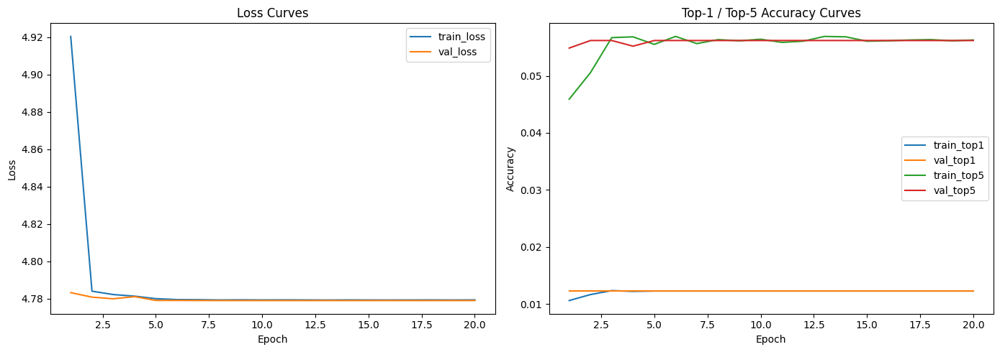

In [28]:
if not history:
    history = load_json(HISTORY_PATH)

epochs = [record["epoch"] for record in history]

plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs, [record["train_loss"] for record in history], label="train_loss")
plt.plot(epochs, [record["val_loss"] for record in history], label="val_loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Loss Curves")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, [record["train_top1"] for record in history], label="train_top1")
plt.plot(epochs, [record["val_top1"] for record in history], label="val_top1")
plt.plot(epochs, [record["train_top5"] for record in history], label="train_top5")
plt.plot(epochs, [record["val_top5"] for record in history], label="val_top5")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Top-1 / Top-5 Accuracy Curves")
plt.legend()

plt.tight_layout()
plt.show()

#### Đánh giá trên test set

Sau khi train xong, ta load lại checkpoint tốt nhất theo val_top1 để đo trên tập test.

In [29]:
checkpoint = torch.load(CHECKPOINT_PATH, map_location=DEVICE)
model.load_state_dict(checkpoint["model_state_dict"])

test_metrics = evaluate(
    model=model,
    loader=test_loader,
    criterion=criterion,
    device=DEVICE,
)

print(f"Best checkpoint epoch: {checkpoint['epoch']}")
print(f"Stored best val_top1 : {checkpoint['best_val_top1']:.4f}")
print(f"Test loss            : {test_metrics['loss']:.4f}")
print(f"Test top-1 accuracy  : {test_metrics['top1']:.4f}")
print(f"Test top-5 accuracy  : {test_metrics['top5']:.4f}")

Best checkpoint epoch: 1
Stored best val_top1 : 0.0122
Test loss            : 4.7835
Test top-1 accuracy  : 0.0122
Test top-5 accuracy  : 0.0550


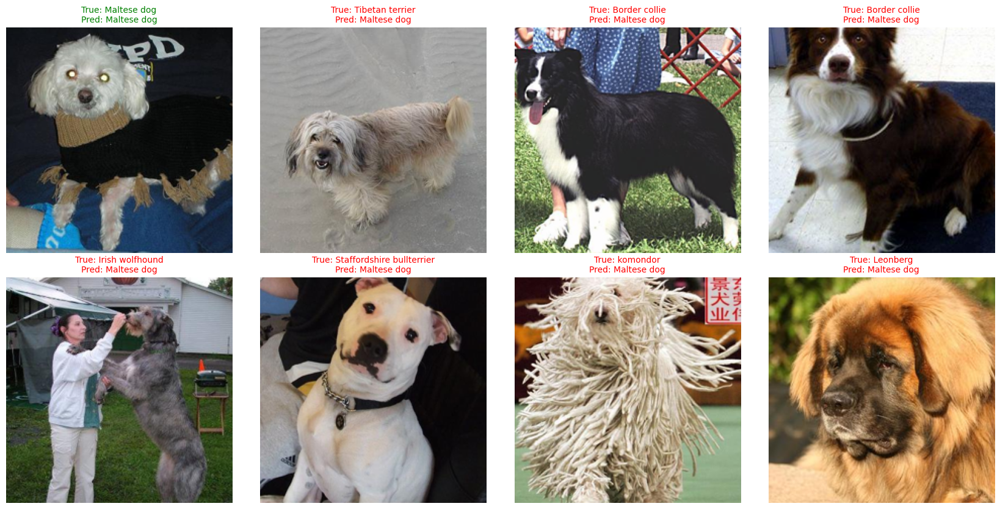

In [30]:
def denormalize_image(image_tensor: torch.Tensor) -> np.ndarray:
    mean = torch.tensor(NORMALIZATION_MEAN).view(3, 1, 1)
    std = torch.tensor(NORMALIZATION_STD).view(3, 1, 1)

    image = image_tensor.detach().cpu() * std + mean
    image = image.clamp(0.0, 1.0)
    return image.permute(1, 2, 0).numpy()


@torch.inference_mode()
def visualize_predictions(
    model: nn.Module,
    dataset: Dataset,
    idx_to_class: dict[int, str],
    device: torch.device,
    num_samples: int = 8,
) -> None:
    model.eval()

    chosen_indices = random.sample(range(len(dataset)), k=min(num_samples, len(dataset)))
    cols = 4
    rows = int(np.ceil(len(chosen_indices) / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(4.2 * cols, 4.2 * rows))
    axes = np.array(axes).reshape(-1)

    for ax in axes:
        ax.axis("off")

    for ax, index in zip(axes, chosen_indices):
        image_tensor, label = dataset[index]
        logits = model(image_tensor.unsqueeze(0).to(device))
        prediction = int(logits.argmax(dim=1).item())

        true_name = idx_to_class[label].split("-", 1)[1].replace("_", " ")
        pred_name = idx_to_class[prediction].split("-", 1)[1].replace("_", " ")
        correct = prediction == label

        ax.imshow(denormalize_image(image_tensor))
        ax.set_title(
            f"True: {true_name}\nPred: {pred_name}",
            color="green" if correct else "red",
            fontsize=10,
        )

    plt.tight_layout()
    plt.show()


visualize_predictions(model, test_dataset, idx_to_class, DEVICE, num_samples=8)

### Week 8-9 — Transfer Learning: ResNet50, MobileNetV2, EfficientNet-B0


Notebook này tiếp nối week67 và tập trung vào:

- Áp dụng transfer learning với 3 backbone pretrained trên ImageNet:
    - ResNet50 — baseline phổ biến, 25M params
    - MobileNetV2 — lightweight, tối ưu cho mobile/edge
    - EfficientNet-B0 — cân bằng accuracy/FLOPs tốt nhất (compound scaling)

- Chiến lược 2 pha:
    - Phase 1 — Feature Extraction: freeze toàn bộ backbone, chỉ train classifier head mới
    - Phase 2 — Fine-tuning: unfreeze backbone, train end-to-end với differential learning rate
    - So sánh kết quả với AlexNet from scratch (tuần 6-7)

Nguồn tham khảo:

- torchvision models
- How transferable are features in deep neural networks? (Yosinski et al., 2014)
- EfficientNet: Rethinking Model Scaling for CNNs (Tan & Le, 2019)

In [31]:
from __future__ import annotations

import json
import random
import time
import xml.etree.ElementTree as ET
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import models, transforms
from torchvision.transforms import InterpolationMode

In [32]:
ARTIFACTS_DIR = Path("./artifacts/datasets")
CHECKPOINT_DIR = Path("./artifacts/checkpoints")
HISTORY_DIR = Path("./artifacts/training")

CHECKPOINT_DIR.mkdir(parents=True, exist_ok=True)
HISTORY_DIR.mkdir(parents=True, exist_ok=True)

CLASS_TO_IDX_PATH = ARTIFACTS_DIR / "class_to_idx.json"
TRAIN_RECORDS_PATH = ARTIFACTS_DIR / "train_records.json"
VAL_RECORDS_PATH = ARTIFACTS_DIR / "val_records.json"
TEST_RECORDS_PATH = ARTIFACTS_DIR / "test_records.json"

IMAGE_SIZE = 224
RESIZE_SIZE = 256

BATCH_SIZE = 32
NUM_WORKERS = 8

PHASE1_EPOCHS = 5
PHASE2_EPOCHS = 15

PHASE1_LR = 1e-3
PHASE2_LR_BACKBONE = 1e-5
PHASE2_LR_HEAD = 1e-4
WEIGHT_DECAY = 1e-4

USE_BBOX = True
BBOX_PADDING = 0.05

IMAGENET_MEAN = (0.485, 0.456, 0.406)
IMAGENET_STD = (0.229, 0.224, 0.225)

RANDOM_SEED = 42
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
USE_AMP = DEVICE.type == "cuda"

print(f"Device          : {DEVICE}")
print(f"Batch size      : {BATCH_SIZE}")
print(f"Num workers     : {NUM_WORKERS}")
print(f"Phase 1 epochs  : {PHASE1_EPOCHS}")
print(f"Phase 2 epochs  : {PHASE2_EPOCHS}")

Device          : cuda
Batch size      : 32
Num workers     : 8
Phase 1 epochs  : 5
Phase 2 epochs  : 15


In [33]:
def seed_everything(seed: int = 42) -> None:
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)


def load_json(path: Path):
    if not path.exists():
        raise FileNotFoundError(
            f"Không tìm thấy file: {path}. Hãy chạy notebook tuần 5 trước."
        )
    return json.loads(path.read_text(encoding="utf-8"))


def parse_annotation(annotation_path: str) -> dict:
    root = ET.parse(annotation_path).getroot()
    size_node = root.find("size")
    object_node = root.find("object")
    bbox_node = object_node.find("bndbox")

    return {
        "width": int(size_node.findtext("width")),
        "height": int(size_node.findtext("height")),
        "bbox": {
            "xmin": int(bbox_node.findtext("xmin")),
            "ymin": int(bbox_node.findtext("ymin")),
            "xmax": int(bbox_node.findtext("xmax")),
            "ymax": int(bbox_node.findtext("ymax")),
        },
    }


def crop_with_bbox(
    image: Image.Image,
    bbox: dict,
    padding_ratio: float = 0.0,
) -> Image.Image:
    xmin, ymin, xmax, ymax = bbox["xmin"], bbox["ymin"], bbox["xmax"], bbox["ymax"]
    box_width = xmax - xmin
    box_height = ymax - ymin

    pad_x = int(box_width * padding_ratio)
    pad_y = int(box_height * padding_ratio)

    xmin = max(0, xmin - pad_x)
    ymin = max(0, ymin - pad_y)
    xmax = min(image.width, xmax + pad_x)
    ymax = min(image.height, ymax + pad_y)

    return image.crop((xmin, ymin, xmax, ymax))


def accuracy_at_k(logits: torch.Tensor, targets: torch.Tensor, topk=(1, 5)) -> dict[int, float]:
    max_k = min(max(topk), logits.shape[1])
    _, pred = logits.topk(max_k, dim=1, largest=True, sorted=True)
    pred = pred.t()
    correct = pred.eq(targets.view(1, -1).expand_as(pred))

    results = {}
    batch_size = targets.size(0)
    for k in topk:
        k = min(k, logits.shape[1])
        correct_k = correct[:k].reshape(-1).float().sum(0)
        results[k] = (correct_k / batch_size).item()
    return results


def count_trainable_parameters(model: nn.Module) -> int:
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


def count_total_parameters(model: nn.Module) -> int:
    return sum(p.numel() for p in model.parameters())


seed_everything(RANDOM_SEED)

In [34]:
class_to_idx = load_json(CLASS_TO_IDX_PATH)
idx_to_class = {idx: class_name for class_name, idx in class_to_idx.items()}

train_records = load_json(TRAIN_RECORDS_PATH)
val_records = load_json(VAL_RECORDS_PATH)
test_records = load_json(TEST_RECORDS_PATH)

num_classes = len(class_to_idx)

print(f"Num classes   : {num_classes}")
print(f"Train records : {len(train_records)}")
print(f"Val records   : {len(val_records)}")
print(f"Test records  : {len(test_records)}")
print(json.dumps(train_records[0], indent=2, ensure_ascii=False))
     

Num classes   : 120
Train records : 14355
Val records   : 3025
Test records  : 3200
{
  "image_path": "/kaggle/input/datasets/jessicali9530/stanford-dogs-dataset/images/Images/n02091244-Ibizan_hound/n02091244_3911.jpg",
  "annotation_path": "/kaggle/input/datasets/jessicali9530/stanford-dogs-dataset/annotations/Annotation/n02091244-Ibizan_hound/n02091244_3911",
  "class_folder": "n02091244-Ibizan_hound",
  "breed_name": "Ibizan hound",
  "class_id": 22
}


#### Dataset và transforms

Transfer learning dùng pretrained weights nên bắt buộc sử dụng ImageNet normalization.

Data augmentation pipeline:

- Train: Resize(256) → RandomResizedCrop(224) → RandomHorizontalFlip → ColorJitter → Normalize
- Val/Test: Resize(256) → CenterCrop(224) → Normalize
  
So với AlexNet notebook, ta thêm RandomResizedCrop và ColorJitter nhẹ — hai augmentation phổ biến khi fine-tune pretrained models giúp tránh overfit trên dataset nhỏ.

In [35]:
class StanfordDogsDataset(Dataset):
    def __init__(
        self,
        records: list[dict],
        transform=None,
        use_bbox: bool = False,
        bbox_padding: float = 0.0,
    ) -> None:
        self.records = list(records)
        self.transform = transform
        self.use_bbox = use_bbox
        self.bbox_padding = bbox_padding

    def __len__(self) -> int:
        return len(self.records)

    def __getitem__(self, index: int):
        record = self.records[index]

        with Image.open(record["image_path"]) as pil_image:
            image = pil_image.convert("RGB")

        if self.use_bbox:
            annotation = parse_annotation(record["annotation_path"])
            image = crop_with_bbox(
                image,
                annotation["bbox"],
                padding_ratio=self.bbox_padding,
            )

        if self.transform is not None:
            image = self.transform(image)

        label = record["class_id"]
        return image, label


train_transform = transforms.Compose(
    [
        transforms.Resize(RESIZE_SIZE, interpolation=InterpolationMode.BICUBIC),
        transforms.RandomResizedCrop(IMAGE_SIZE, scale=(0.8, 1.0)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1),
        transforms.ToTensor(),
        transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ]
)

eval_transform = transforms.Compose(
    [
        transforms.Resize(RESIZE_SIZE, interpolation=InterpolationMode.BICUBIC),
        transforms.CenterCrop(IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ]
)

train_dataset = StanfordDogsDataset(
    train_records,
    transform=train_transform,
    use_bbox=USE_BBOX,
    bbox_padding=BBOX_PADDING,
)

val_dataset = StanfordDogsDataset(
    val_records,
    transform=eval_transform,
    use_bbox=USE_BBOX,
    bbox_padding=BBOX_PADDING,
)

test_dataset = StanfordDogsDataset(
    test_records,
    transform=eval_transform,
    use_bbox=USE_BBOX,
    bbox_padding=BBOX_PADDING,
)

DATALOADER_KWARGS = {
    "num_workers": NUM_WORKERS,
    "pin_memory": torch.cuda.is_available(),
}
if NUM_WORKERS > 0:
    DATALOADER_KWARGS["persistent_workers"] = True
    DATALOADER_KWARGS["prefetch_factor"] = 2

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    **DATALOADER_KWARGS,
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    **DATALOADER_KWARGS,
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    **DATALOADER_KWARGS,
)

images, labels = next(iter(train_loader))
print(f"Train batch images shape: {tuple(images.shape)}")
print(f"Train batch labels shape: {tuple(labels.shape)}")

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:424: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:430: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()


Train batch images shape: (32, 3, 224, 224)
Train batch labels shape: (32,)


#### Model factory

Hàm build_transfer_model nhận tên backbone và trả về model đã:

1. Load pretrained ImageNet weights
2. Thay classifier head cuối cùng cho 120 classes
3. Freeze toàn bộ backbone (cho Phase 1 — feature extraction)

Mỗi backbone có cách thay head khác nhau:

- ResNet50: thay model.fc (Linear)
- MobileNetV2: thay model.classifier[1] (Linear)
- EfficientNet-B0: thay model.classifier[1] (Linear)

In [36]:
BACKBONE_REGISTRY: dict[str, dict] = {
    "resnet50": {
        "factory": lambda: models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2),
        "head_attr": "fc",
        "feature_dim": 2048,
    },
    "mobilenet_v2": {
        "factory": lambda: models.mobilenet_v2(weights=models.MobileNet_V2_Weights.IMAGENET1K_V2),
        "head_attr": "classifier.1",
        "feature_dim": 1280,
    },
    "efficientnet_b0": {
        "factory": lambda: models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.IMAGENET1K_V1),
        "head_attr": "classifier.1",
        "feature_dim": 1280,
    },
}


def _set_nested_attr(model: nn.Module, attr_path: str, value: nn.Module) -> None:
    """Set a nested attribute like 'classifier.1' on a module."""
    parts = attr_path.split(".")
    parent = model
    for part in parts[:-1]:
        parent = getattr(parent, part) if not part.isdigit() else parent[int(part)]
    last = parts[-1]
    if last.isdigit():
        parent[int(last)] = value
    else:
        setattr(parent, last, value)


def _get_nested_attr(model: nn.Module, attr_path: str) -> nn.Module:
    obj = model
    for part in attr_path.split("."):
        obj = getattr(obj, part) if not part.isdigit() else obj[int(part)]
    return obj


def build_transfer_model(
    backbone_name: str,
    num_classes: int,
    dropout: float = 0.3,
    freeze_backbone: bool = True,
) -> nn.Module:
    if backbone_name not in BACKBONE_REGISTRY:
        raise ValueError(f"Unknown backbone: {backbone_name}. Choose from {list(BACKBONE_REGISTRY)}")

    config = BACKBONE_REGISTRY[backbone_name]
    model = config["factory"]()
    feature_dim = config["feature_dim"]

    if freeze_backbone:
        for param in model.parameters():
            param.requires_grad = False

    new_head = nn.Sequential(
        nn.Dropout(p=dropout),
        nn.Linear(feature_dim, num_classes),
    )

    if backbone_name == "resnet50":
        model.fc = new_head
    else:
        model.classifier = new_head

    return model


def unfreeze_backbone(model: nn.Module) -> None:
    for param in model.parameters():
        param.requires_grad = True


def get_param_groups(
    model: nn.Module,
    backbone_name: str,
    lr_backbone: float,
    lr_head: float,
) -> list[dict]:
    """Split parameters into backbone vs head groups with different LRs."""
    if backbone_name == "resnet50":
        head_params = set(id(p) for p in model.fc.parameters())
    else:
        head_params = set(id(p) for p in model.classifier.parameters())

    backbone_params = [p for p in model.parameters() if p.requires_grad and id(p) not in head_params]
    head_params_list = [p for p in model.parameters() if p.requires_grad and id(p) in head_params]

    return [
        {"params": backbone_params, "lr": lr_backbone},
        {"params": head_params_list, "lr": lr_head},
    ]


for name in BACKBONE_REGISTRY:
    m = build_transfer_model(name, num_classes=num_classes, freeze_backbone=True)
    m = m.to(DEVICE)
    dummy = torch.randn(2, 3, IMAGE_SIZE, IMAGE_SIZE, device=DEVICE)
    out = m(dummy)
    print(
        f"{name:20s} | output: {tuple(out.shape)} | "
        f"total params: {count_total_parameters(m):>12,} | "
        f"trainable (Phase 1): {count_trainable_parameters(m):>10,}"
    )
    del m, dummy, out
    torch.cuda.empty_cache() if torch.cuda.is_available() else None
     

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 234MB/s]


resnet50             | output: (2, 120) | total params:   23,753,912 | trainable (Phase 1):    245,880
Downloading: "https://download.pytorch.org/models/mobilenet_v2-7ebf99e0.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-7ebf99e0.pth


100%|██████████| 13.6M/13.6M [00:00<00:00, 169MB/s]


mobilenet_v2         | output: (2, 120) | total params:    2,377,592 | trainable (Phase 1):    153,720
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 176MB/s]


efficientnet_b0      | output: (2, 120) | total params:    4,161,268 | trainable (Phase 1):    153,720


#### Training engine
Reuse training loop từ tuần 6-7 với một số cải tiến cho transfer learning:

- Phase 1 (Feature Extraction): freeze backbone, dùng AdamW chỉ train head, LR 1e-3
    - BatchNorm freeze: ngoài requires_grad=False, ta còn giữ tất cả BN layers ở eval() mode trong Phase 1 để running mean/var không bị cập nhật bởi dữ liệu mới (bảo toàn pretrained statistics)
- Phase 2 (Fine-tuning): unfreeze backbone, dùng AdamW với differential LR:
    - Backbone: 1e-5 (tránh phá pretrained features)
    - Head: 1e-4
    - BN layers trở lại train() mode bình thường để adapt vào domain mới
- Scheduler: CosineAnnealingLR — phổ biến hơn ReduceLROnPlateau cho fine-tuning
- Label smoothing 0.1 — giảm overconfidence trên dataset nhỏ

In [37]:
def _freeze_bn(model: nn.Module) -> None:
    """Set all BatchNorm layers to eval mode (preserves pretrained running stats)."""
    for module in model.modules():
        if isinstance(module, (nn.BatchNorm2d, nn.BatchNorm1d, nn.SyncBatchNorm)):
            module.eval()


def train_one_epoch(
    model: nn.Module,
    loader: DataLoader,
    optimizer: optim.Optimizer,
    criterion: nn.Module,
    device: torch.device,
    scaler: torch.amp.GradScaler,
    use_amp: bool = False,
    freeze_bn: bool = False,
) -> dict:
    model.train()
    if freeze_bn:
        _freeze_bn(model)

    running_loss = 0.0
    running_top1 = 0.0
    running_top5 = 0.0
    seen_samples = 0

    for images, labels in loader:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        with torch.amp.autocast(device_type=device.type, enabled=use_amp):
            logits = model(images)
            loss = criterion(logits, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        batch_size = labels.size(0)
        metrics = accuracy_at_k(logits.detach(), labels, topk=(1, 5))

        running_loss += loss.item() * batch_size
        running_top1 += metrics[1] * batch_size
        running_top5 += metrics[5] * batch_size
        seen_samples += batch_size

    return {
        "loss": running_loss / seen_samples,
        "top1": running_top1 / seen_samples,
        "top5": running_top5 / seen_samples,
    }


@torch.inference_mode()
def evaluate(
    model: nn.Module,
    loader: DataLoader,
    criterion: nn.Module,
    device: torch.device,
) -> dict:
    model.eval()

    running_loss = 0.0
    running_top1 = 0.0
    running_top5 = 0.0
    seen_samples = 0

    for images, labels in loader:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        logits = model(images)
        loss = criterion(logits, labels)

        batch_size = labels.size(0)
        metrics = accuracy_at_k(logits, labels, topk=(1, 5))

        running_loss += loss.item() * batch_size
        running_top1 += metrics[1] * batch_size
        running_top5 += metrics[5] * batch_size
        seen_samples += batch_size

    return {
        "loss": running_loss / seen_samples,
        "top1": running_top1 / seen_samples,
        "top5": running_top5 / seen_samples,
    }
     

In [38]:
def run_transfer_pipeline(
    backbone_name: str,
    num_classes: int,
    train_loader: DataLoader,
    val_loader: DataLoader,
    device: torch.device,
    use_amp: bool,
    phase1_epochs: int,
    phase2_epochs: int,
    phase1_lr: float,
    phase2_lr_backbone: float,
    phase2_lr_head: float,
    weight_decay: float,
    checkpoint_dir: Path,
    history_dir: Path,
) -> tuple[nn.Module, list[dict]]:
    """Two-phase transfer learning: feature extraction then fine-tuning."""

    tag = backbone_name
    checkpoint_path = checkpoint_dir / f"{tag}_best.pt"
    history_path = history_dir / f"{tag}_history.json"

    print(f"\n{'='*70}")
    print(f"  BACKBONE: {backbone_name.upper()}")
    print(f"{'='*70}")

    # ── Phase 1: Feature Extraction ─────────────────────────────────────
    print(f"\n--- Phase 1: Feature Extraction ({phase1_epochs} epochs) ---")

    seed_everything(RANDOM_SEED)
    model = build_transfer_model(backbone_name, num_classes, dropout=0.3, freeze_backbone=True)
    model = model.to(device)

    print(f"Trainable params: {count_trainable_parameters(model):,} / {count_total_parameters(model):,}")

    criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
    optimizer = optim.AdamW(
        filter(lambda p: p.requires_grad, model.parameters()),
        lr=phase1_lr,
        weight_decay=weight_decay,
    )
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=phase1_epochs)
    scaler = torch.amp.GradScaler("cuda", enabled=use_amp)

    history: list[dict] = []
    best_val_top1 = -float("inf")

    for epoch in range(1, phase1_epochs + 1):
        start_time = time.time()

        train_metrics = train_one_epoch(model, train_loader, optimizer, criterion, device, scaler, use_amp, freeze_bn=True)
        val_metrics = evaluate(model, val_loader, criterion, device)

        scheduler.step()
        current_lr = optimizer.param_groups[0]["lr"]
        epoch_time = time.time() - start_time

        record = {
            "phase": 1,
            "epoch": epoch,
            "lr": current_lr,
            "train_loss": train_metrics["loss"],
            "train_top1": train_metrics["top1"],
            "train_top5": train_metrics["top5"],
            "val_loss": val_metrics["loss"],
            "val_top1": val_metrics["top1"],
            "val_top5": val_metrics["top5"],
            "epoch_time_sec": epoch_time,
        }
        history.append(record)

        marker = ""
        if record["val_top1"] > best_val_top1:
            best_val_top1 = record["val_top1"]
            torch.save(
                {
                    "epoch": epoch,
                    "phase": 1,
                    "backbone": backbone_name,
                    "model_state_dict": model.state_dict(),
                    "best_val_top1": best_val_top1,
                    "history": history,
                    "class_to_idx": class_to_idx,
                },
                checkpoint_path,
            )
            marker = " ★"

        print(
            f"  P1 Epoch {epoch:02d}/{phase1_epochs} | "
            f"lr={current_lr:.6f} | "
            f"train_top1={record['train_top1']:.4f} | "
            f"val_top1={record['val_top1']:.4f} | val_top5={record['val_top5']:.4f} | "
            f"{epoch_time:.1f}s{marker}"
        )

    print(f"  Phase 1 best val_top1: {best_val_top1:.4f}")

    # ── Phase 2: Fine-tuning ────────────────────────────────────────────
    print(f"\n--- Phase 2: Fine-tuning ({phase2_epochs} epochs) ---")

    unfreeze_backbone(model)
    print(f"Trainable params: {count_trainable_parameters(model):,} / {count_total_parameters(model):,}")

    param_groups = get_param_groups(model, backbone_name, phase2_lr_backbone, phase2_lr_head)
    optimizer = optim.AdamW(param_groups, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=phase2_epochs)
    scaler = torch.amp.GradScaler("cuda", enabled=use_amp)

    for epoch in range(1, phase2_epochs + 1):
        start_time = time.time()

        train_metrics = train_one_epoch(model, train_loader, optimizer, criterion, device, scaler, use_amp)
        val_metrics = evaluate(model, val_loader, criterion, device)

        scheduler.step()
        lr_bb = optimizer.param_groups[0]["lr"]
        lr_hd = optimizer.param_groups[1]["lr"]
        epoch_time = time.time() - start_time

        global_epoch = phase1_epochs + epoch
        record = {
            "phase": 2,
            "epoch": global_epoch,
            "lr_backbone": lr_bb,
            "lr_head": lr_hd,
            "train_loss": train_metrics["loss"],
            "train_top1": train_metrics["top1"],
            "train_top5": train_metrics["top5"],
            "val_loss": val_metrics["loss"],
            "val_top1": val_metrics["top1"],
            "val_top5": val_metrics["top5"],
            "epoch_time_sec": epoch_time,
        }
        history.append(record)

        marker = ""
        if record["val_top1"] > best_val_top1:
            best_val_top1 = record["val_top1"]
            torch.save(
                {
                    "epoch": global_epoch,
                    "phase": 2,
                    "backbone": backbone_name,
                    "model_state_dict": model.state_dict(),
                    "best_val_top1": best_val_top1,
                    "history": history,
                    "class_to_idx": class_to_idx,
                },
                checkpoint_path,
            )
            marker = " ★"

        print(
            f"  P2 Epoch {epoch:02d}/{phase2_epochs} (global {global_epoch:02d}) | "
            f"lr_bb={lr_bb:.7f} lr_hd={lr_hd:.6f} | "
            f"train_top1={record['train_top1']:.4f} | "
            f"val_top1={record['val_top1']:.4f} | val_top5={record['val_top5']:.4f} | "
            f"{epoch_time:.1f}s{marker}"
        )

    history_path.write_text(json.dumps(history, indent=2, ensure_ascii=False), encoding="utf-8")
    print(f"\n  Final best val_top1: {best_val_top1:.4f}")
    print(f"  Checkpoint: {checkpoint_path}")
    print(f"  History:    {history_path}")

    return model, history

#### Huấn luyện cả 3 backbones

Chạy pipeline tuần tự cho từng backbone. Mỗi backbone sẽ:

- Phase 1 — Train head (5 epochs)
- Phase 2 — Fine-tune toàn mạng (15 epochs)

Kết quả (checkpoint, history JSON) được lưu riêng biệt theo tên backbone.

In [39]:
all_results: dict[str, dict] = {}
all_histories: dict[str, list[dict]] = {}

for backbone_name in BACKBONE_REGISTRY:
    model, history = run_transfer_pipeline(
        backbone_name=backbone_name,
        num_classes=num_classes,
        train_loader=train_loader,
        val_loader=val_loader,
        device=DEVICE,
        use_amp=USE_AMP,
        phase1_epochs=PHASE1_EPOCHS,
        phase2_epochs=PHASE2_EPOCHS,
        phase1_lr=PHASE1_LR,
        phase2_lr_backbone=PHASE2_LR_BACKBONE,
        phase2_lr_head=PHASE2_LR_HEAD,
        weight_decay=WEIGHT_DECAY,
        checkpoint_dir=CHECKPOINT_DIR,
        history_dir=HISTORY_DIR,
    )
    all_histories[backbone_name] = history

    del model
    torch.cuda.empty_cache() if torch.cuda.is_available() else None

print("\nAll backbones trained.")


  BACKBONE: RESNET50

--- Phase 1: Feature Extraction (5 epochs) ---
Trainable params: 245,880 / 23,753,912
  P1 Epoch 01/5 | lr=0.000905 | train_top1=0.7528 | val_top1=0.8740 | val_top5=0.9845 | 63.2s ★
  P1 Epoch 02/5 | lr=0.000655 | train_top1=0.9112 | val_top1=0.8876 | val_top5=0.9828 | 60.3s ★
  P1 Epoch 03/5 | lr=0.000345 | train_top1=0.9241 | val_top1=0.8886 | val_top5=0.9838 | 60.3s ★
  P1 Epoch 04/5 | lr=0.000095 | train_top1=0.9333 | val_top1=0.8906 | val_top5=0.9835 | 62.2s ★
  P1 Epoch 05/5 | lr=0.000000 | train_top1=0.9408 | val_top1=0.8912 | val_top5=0.9841 | 61.5s ★
  Phase 1 best val_top1: 0.8912

--- Phase 2: Fine-tuning (15 epochs) ---
Trainable params: 23,753,912 / 23,753,912
  P2 Epoch 01/15 (global 06) | lr_bb=0.0000099 lr_hd=0.000099 | train_top1=0.8481 | val_top1=0.8354 | val_top5=0.9623 | 75.2s
  P2 Epoch 02/15 (global 07) | lr_bb=0.0000096 lr_hd=0.000096 | train_top1=0.9021 | val_top1=0.8483 | val_top5=0.9699 | 74.5s
  P2 Epoch 03/15 (global 08) | lr_bb=0.0000

#### Training curves

Vẽ loss và accuracy curves cho cả 3 backbones trên cùng một figure để so sánh. Đường kẻ dọc đánh dấu ranh giới giữa Phase 1 (feature extraction) và Phase 2 (fine-tuning).

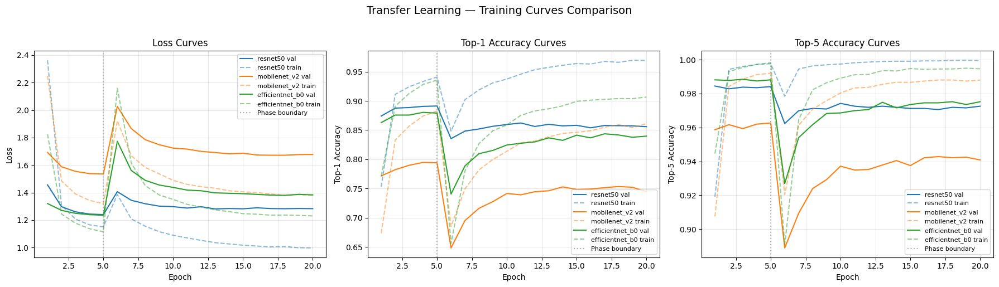

In [40]:
for name in BACKBONE_REGISTRY:
    if name not in all_histories:
        path = HISTORY_DIR / f"{name}_history.json"
        if path.exists():
            all_histories[name] = load_json(path)

COLORS = {"resnet50": "#1f77b4", "mobilenet_v2": "#ff7f0e", "efficientnet_b0": "#2ca02c"}

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for backbone_name, history in all_histories.items():
    epochs = [r["epoch"] for r in history]
    color = COLORS.get(backbone_name, None)

    axes[0].plot(epochs, [r["val_loss"] for r in history], label=f"{backbone_name} val", color=color)
    axes[0].plot(epochs, [r["train_loss"] for r in history], label=f"{backbone_name} train", color=color, linestyle="--", alpha=0.5)

    axes[1].plot(epochs, [r["val_top1"] for r in history], label=f"{backbone_name} val", color=color)
    axes[1].plot(epochs, [r["train_top1"] for r in history], label=f"{backbone_name} train", color=color, linestyle="--", alpha=0.5)

    axes[2].plot(epochs, [r["val_top5"] for r in history], label=f"{backbone_name} val", color=color)
    axes[2].plot(epochs, [r["train_top5"] for r in history], label=f"{backbone_name} train", color=color, linestyle="--", alpha=0.5)

for ax in axes:
    ax.axvline(x=PHASE1_EPOCHS, color="gray", linestyle=":", alpha=0.6, label="Phase boundary")
    ax.set_xlabel("Epoch")
    ax.legend(fontsize=8)
    ax.grid(alpha=0.3)

axes[0].set_ylabel("Loss")
axes[0].set_title("Loss Curves")

axes[1].set_ylabel("Top-1 Accuracy")
axes[1].set_title("Top-1 Accuracy Curves")

axes[2].set_ylabel("Top-5 Accuracy")
axes[2].set_title("Top-5 Accuracy Curves")

plt.suptitle("Transfer Learning — Training Curves Comparison", fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

#### Đánh giá trên test set

Load lại best checkpoint của mỗi backbone và đánh giá trên tập test. Tổng hợp kết quả vào bảng so sánh cuối cùng.

In [41]:
criterion_eval = nn.CrossEntropyLoss()

test_results: dict[str, dict] = {}

for backbone_name in BACKBONE_REGISTRY:
    ckpt_path = CHECKPOINT_DIR / f"{backbone_name}_best.pt"
    if not ckpt_path.exists():
        print(f"Checkpoint not found for {backbone_name}, skipping.")
        continue

    checkpoint = torch.load(ckpt_path, map_location=DEVICE, weights_only=False)

    model = build_transfer_model(backbone_name, num_classes, dropout=0.3, freeze_backbone=False)
    model.load_state_dict(checkpoint["model_state_dict"])
    model = model.to(DEVICE)

    test_metrics = evaluate(model, test_loader, criterion_eval, DEVICE)

    test_results[backbone_name] = {
        "best_epoch": checkpoint["epoch"],
        "best_phase": checkpoint["phase"],
        "val_top1": checkpoint["best_val_top1"],
        "test_loss": test_metrics["loss"],
        "test_top1": test_metrics["top1"],
        "test_top5": test_metrics["top5"],
        "total_params": count_total_parameters(model),
    }

    print(
        f"{backbone_name:20s} | "
        f"best epoch: {checkpoint['epoch']:2d} (P{checkpoint['phase']}) | "
        f"val_top1: {checkpoint['best_val_top1']:.4f} | "
        f"test_top1: {test_metrics['top1']:.4f} | "
        f"test_top5: {test_metrics['top5']:.4f}"
    )

    del model, checkpoint
    torch.cuda.empty_cache() if torch.cuda.is_available() else None

resnet50             | best epoch:  5 (P1) | val_top1: 0.8912 | test_top1: 0.8747 | test_top5: 0.9866
mobilenet_v2         | best epoch:  4 (P1) | val_top1: 0.7947 | test_top1: 0.7800 | test_top5: 0.9641
efficientnet_b0      | best epoch:  4 (P1) | val_top1: 0.8803 | test_top1: 0.8709 | test_top5: 0.9875


#### Bảng so sánh tổng hợp

So sánh kết quả của 3 backbone transfer learning với AlexNet from scratch (tuần 6-7).

In [42]:
rows = []

alexnet_history_path = HISTORY_DIR / "alexnet_from_scratch_history.json"
if alexnet_history_path.exists():
    alexnet_history = load_json(alexnet_history_path)
    best_alexnet = max(alexnet_history, key=lambda r: r["val_top1"])

    rows.append({
        "Model": "AlexNet (scratch)",
        "Params": "57.5M",
        "Best Epoch": best_alexnet["epoch"],
        "Val Top-1": f"{best_alexnet['val_top1']:.4f}",
        "Test Top-1": "N/A (val only)",
        "Test Top-5": "N/A (val only)",
    })

for name, res in test_results.items():
    rows.append({
        "Model": f"{name} (transfer)",
        "Params": f"{res['total_params']/1e6:.1f}M",
        "Best Epoch": f"{res['best_epoch']} (P{res['best_phase']})",
        "Val Top-1": f"{res['val_top1']:.4f}",
        "Test Top-1": f"{res['test_top1']:.4f}",
        "Test Top-5": f"{res['test_top5']:.4f}",
    })

if not rows:
    print("No results to display. Train at least one backbone first.")
else:
    header = rows[0].keys()
    col_widths = {k: max(len(k), max(len(str(r[k])) for r in rows)) for k in header}
    sep = " | ".join("-" * col_widths[k] for k in header)
    header_str = " | ".join(k.ljust(col_widths[k]) for k in header)

    print(header_str)
    print(sep)
    for row in rows:
        print(" | ".join(str(row[k]).ljust(col_widths[k]) for k in header))

Model                      | Params | Best Epoch | Val Top-1 | Test Top-1     | Test Top-5    
-------------------------- | ------ | ---------- | --------- | -------------- | --------------
AlexNet (scratch)          | 57.5M  | 1          | 0.0122    | N/A (val only) | N/A (val only)
resnet50 (transfer)        | 23.8M  | 5 (P1)     | 0.8912    | 0.8747         | 0.9866        
mobilenet_v2 (transfer)    | 2.4M   | 4 (P1)     | 0.7947    | 0.7800         | 0.9641        
efficientnet_b0 (transfer) | 4.2M   | 4 (P1)     | 0.8803    | 0.8709         | 0.9875        


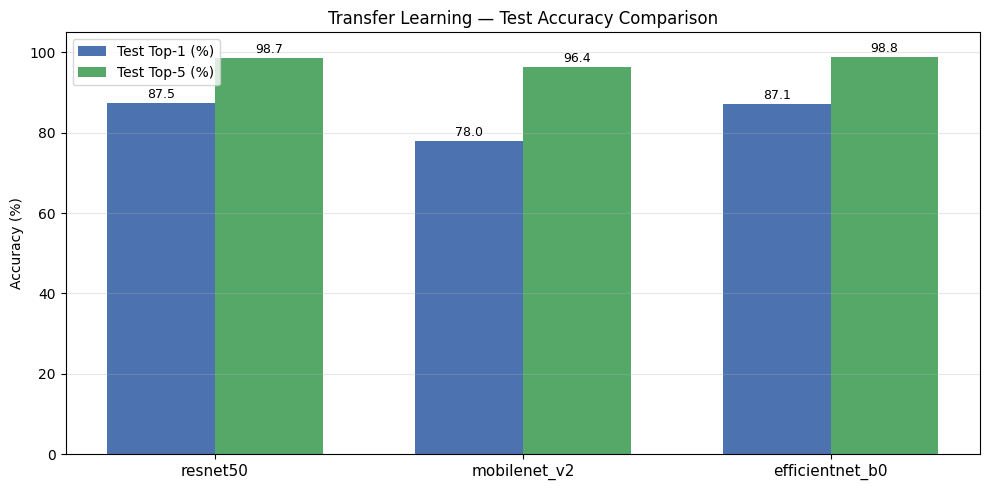

In [43]:
if test_results:
    names = list(test_results.keys())
    top1_scores = [test_results[n]["test_top1"] * 100 for n in names]
    top5_scores = [test_results[n]["test_top5"] * 100 for n in names]

    x = np.arange(len(names))
    width = 0.35

    fig, ax = plt.subplots(figsize=(10, 5))
    bars1 = ax.bar(x - width / 2, top1_scores, width, label="Test Top-1 (%)", color="#4c72b0")
    bars2 = ax.bar(x + width / 2, top5_scores, width, label="Test Top-5 (%)", color="#55a868")

    ax.set_ylabel("Accuracy (%)")
    ax.set_title("Transfer Learning — Test Accuracy Comparison")
    ax.set_xticks(x)
    ax.set_xticklabels(names, fontsize=11)
    ax.legend()
    ax.set_ylim(0, 105)
    ax.grid(axis="y", alpha=0.3)

    for bar in bars1:
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.5,
                f"{bar.get_height():.1f}", ha="center", va="bottom", fontsize=9)
    for bar in bars2:
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.5,
                f"{bar.get_height():.1f}", ha="center", va="bottom", fontsize=9)

    plt.tight_layout()
    plt.show()

#### Visualize predictions

Chọn model có val_top1 cao nhất (tránh leak test set vào model selection), sau đó hiển thị dự đoán trên test set.

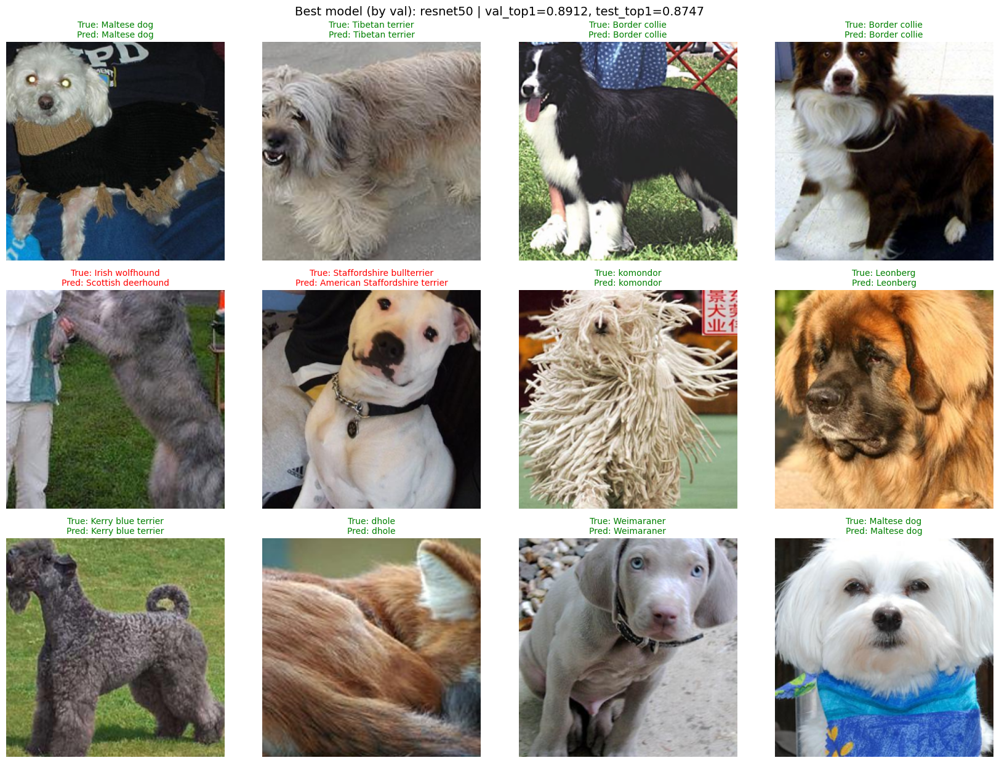

In [44]:
def denormalize_image(image_tensor: torch.Tensor) -> np.ndarray:
    mean = torch.tensor(IMAGENET_MEAN).view(3, 1, 1)
    std = torch.tensor(IMAGENET_STD).view(3, 1, 1)

    image = image_tensor.detach().cpu() * std + mean
    image = image.clamp(0.0, 1.0)
    return image.permute(1, 2, 0).numpy()


@torch.inference_mode()
def visualize_predictions(
    model: nn.Module,
    dataset: Dataset,
    idx_to_class: dict[int, str],
    device: torch.device,
    title: str = "",
    num_samples: int = 8,
) -> None:
    model.eval()

    chosen_indices = random.sample(range(len(dataset)), k=min(num_samples, len(dataset)))
    cols = 4
    rows = int(np.ceil(len(chosen_indices) / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(4.2 * cols, 4.2 * rows))
    axes = np.array(axes).reshape(-1)

    for ax in axes:
        ax.axis("off")

    for ax, index in zip(axes, chosen_indices):
        image_tensor, label = dataset[index]
        logits = model(image_tensor.unsqueeze(0).to(device))
        prediction = int(logits.argmax(dim=1).item())

        true_name = idx_to_class[label].split("-", 1)[1].replace("_", " ")
        pred_name = idx_to_class[prediction].split("-", 1)[1].replace("_", " ")
        correct = prediction == label

        ax.imshow(denormalize_image(image_tensor))
        ax.set_title(
            f"True: {true_name}\nPred: {pred_name}",
            color="green" if correct else "red",
            fontsize=10,
        )

    if title:
        plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()


if test_results:
    best_backbone = max(test_results, key=lambda n: test_results[n]["val_top1"])
    ckpt_path = CHECKPOINT_DIR / f"{best_backbone}_best.pt"
    checkpoint = torch.load(ckpt_path, map_location=DEVICE, weights_only=False)

    best_model = build_transfer_model(best_backbone, num_classes, dropout=0.3, freeze_backbone=False)
    best_model.load_state_dict(checkpoint["model_state_dict"])
    best_model = best_model.to(DEVICE)

    res = test_results[best_backbone]
    visualize_predictions(
        best_model,
        test_dataset,
        idx_to_class,
        DEVICE,
        title=f"Best model (by val): {best_backbone} | val_top1={res['val_top1']:.4f}, test_top1={res['test_top1']:.4f}",
        num_samples=12,
    )

    del best_model, checkpoint
    torch.cuda.empty_cache() if torch.cuda.is_available() else None
     


### Week 10 — Evaluation Report

Notebook này tổng hợp kết quả đánh giá chi tiết cho tất cả các models đã train/fine-tune trong dự án:

| Model | Nguồn | Checkpoint |
|-------|-------|------------|
| AlexNet (from scratch) | `week67_alexnet-from-scratch.ipynb` | `alexnet_from_scratch_best.pt` |
| ResNet50 (transfer) | `week89_transfer_learning.ipynb` | `resnet50_best.pt` |
| MobileNetV2 (transfer) | `week89_transfer_learning.ipynb` | `mobilenet_v2_best.pt` |
| EfficientNet-B0 (transfer) | `week89_transfer_learning.ipynb` | `efficientnet_b0_best.pt` |

Với mỗi model, ta đánh giá trên **train / val / test** và báo cáo:

- **Accuracy** (top-1)
- **Precision** (macro & weighted)
- **Recall** (macro & weighted)
- **F1-score** (macro & weighted)
- **Confusion matrix**
- **Per-class classification report** (top confused pairs)

In [ ]:
from __future__ import annotations

import json
import xml.etree.ElementTree as ET
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from torchvision import models, transforms
from torchvision.transforms import InterpolationMode

from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    f1_score,
    precision_score,
    recall_score,
)

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [ ]:
ARTIFACTS_DIR = Path("./artifacts/datasets")
CHECKPOINT_DIR = Path("./artifacts/checkpoints")
HISTORY_DIR = Path("./artifacts/training")

CLASS_TO_IDX_PATH = ARTIFACTS_DIR / "class_to_idx.json"
TRAIN_RECORDS_PATH = ARTIFACTS_DIR / "train_records.json"
VAL_RECORDS_PATH = ARTIFACTS_DIR / "val_records.json"
TEST_RECORDS_PATH = ARTIFACTS_DIR / "test_records.json"

IMAGE_SIZE = 224
RESIZE_SIZE = 256
BATCH_SIZE = 64
NUM_WORKERS = 0

USE_BBOX = False
BBOX_PADDING = 0.05

IMAGENET_MEAN = (0.485, 0.456, 0.406)
IMAGENET_STD = (0.229, 0.224, 0.225)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(f"Device     : {DEVICE}")
print(f"Batch size : {BATCH_SIZE}")

## 1. Utilities và Dataset

In [ ]:
def load_json(path: Path):
    if not path.exists():
        raise FileNotFoundError(f"Không tìm thấy file: {path}.")
    return json.loads(path.read_text(encoding="utf-8"))


def parse_annotation(annotation_path: str) -> dict:
    root = ET.parse(annotation_path).getroot()
    size_node = root.find("size")
    object_node = root.find("object")
    bbox_node = object_node.find("bndbox")
    return {
        "width": int(size_node.findtext("width")),
        "height": int(size_node.findtext("height")),
        "bbox": {
            "xmin": int(bbox_node.findtext("xmin")),
            "ymin": int(bbox_node.findtext("ymin")),
            "xmax": int(bbox_node.findtext("xmax")),
            "ymax": int(bbox_node.findtext("ymax")),
        },
    }


def crop_with_bbox(
    image: Image.Image, bbox: dict, padding_ratio: float = 0.0
) -> Image.Image:
    xmin, ymin, xmax, ymax = bbox["xmin"], bbox["ymin"], bbox["xmax"], bbox["ymax"]
    bw, bh = xmax - xmin, ymax - ymin
    px, py = int(bw * padding_ratio), int(bh * padding_ratio)
    xmin = max(0, xmin - px)
    ymin = max(0, ymin - py)
    xmax = min(image.width, xmax + px)
    ymax = min(image.height, ymax + py)
    return image.crop((xmin, ymin, xmax, ymax))


class StanfordDogsDataset(Dataset):
    def __init__(
        self,
        records: list[dict],
        transform=None,
        use_bbox: bool = False,
        bbox_padding: float = 0.0,
    ) -> None:
        self.records = list(records)
        self.transform = transform
        self.use_bbox = use_bbox
        self.bbox_padding = bbox_padding

    def __len__(self) -> int:
        return len(self.records)

    def __getitem__(self, index: int):
        record = self.records[index]
        with Image.open(record["image_path"]) as pil_image:
            image = pil_image.convert("RGB")
        if self.use_bbox:
            annotation = parse_annotation(record["annotation_path"])
            image = crop_with_bbox(image, annotation["bbox"], padding_ratio=self.bbox_padding)
        if self.transform is not None:
            image = self.transform(image)
        return image, record["class_id"]

In [ ]:
class_to_idx = load_json(CLASS_TO_IDX_PATH)
idx_to_class = {idx: name for name, idx in class_to_idx.items()}

train_records = load_json(TRAIN_RECORDS_PATH)
val_records = load_json(VAL_RECORDS_PATH)
test_records = load_json(TEST_RECORDS_PATH)

num_classes = len(class_to_idx)

breed_names = [
    idx_to_class[i].split("-", 1)[1].replace("_", " ") for i in range(num_classes)
]

print(f"Num classes   : {num_classes}")
print(f"Train samples : {len(train_records)}")
print(f"Val samples   : {len(val_records)}")
print(f"Test samples  : {len(test_records)}")

In [ ]:
eval_transform = transforms.Compose(
    [
        transforms.Resize(RESIZE_SIZE, interpolation=InterpolationMode.BICUBIC),
        transforms.CenterCrop(IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ]
)

split_configs = {
    "train": train_records,
    "val": val_records,
    "test": test_records,
}

data_loaders: dict[str, DataLoader] = {}
for split_name, records in split_configs.items():
    ds = StanfordDogsDataset(
        records, transform=eval_transform, use_bbox=USE_BBOX, bbox_padding=BBOX_PADDING
    )
    data_loaders[split_name] = DataLoader(
        ds,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=NUM_WORKERS,
        pin_memory=torch.cuda.is_available(),
    )
    print(f"{split_name:5s} loader: {len(ds)} samples, {len(data_loaders[split_name])} batches")

## 2. Định nghĩa models và registry

Tái tạo kiến trúc của từng model giống hệt lúc train để load `state_dict` tương thích.

In [ ]:
class AlexNetFromScratch(nn.Module):
    def __init__(self, num_classes: int, dropout: float = 0.5) -> None:
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=11, stride=4, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(64, 192, kernel_size=5, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((6, 6))
        self.classifier = nn.Sequential(
            nn.Dropout(p=dropout),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        return self.classifier(x)


def _build_transfer_model(backbone_name: str, num_classes: int) -> nn.Module:
    """Rebuild transfer-learning architecture (matching week89 exactly)."""
    dropout = 0.3
    if backbone_name == "resnet50":
        model = models.resnet50(weights=None)
        model.fc = nn.Sequential(nn.Dropout(p=dropout), nn.Linear(2048, num_classes))
    elif backbone_name == "mobilenet_v2":
        model = models.mobilenet_v2(weights=None)
        model.classifier = nn.Sequential(nn.Dropout(p=dropout), nn.Linear(1280, num_classes))
    elif backbone_name == "efficientnet_b0":
        model = models.efficientnet_b0(weights=None)
        model.classifier = nn.Sequential(nn.Dropout(p=dropout), nn.Linear(1280, num_classes))
    else:
        raise ValueError(f"Unknown backbone: {backbone_name}")
    return model


MODEL_REGISTRY: dict[str, dict] = {
    "AlexNet (scratch)": {
        "builder": lambda nc: AlexNetFromScratch(nc, dropout=0.5),
        "checkpoint": CHECKPOINT_DIR / "alexnet_from_scratch_best.pt",
        "source": "week67",
    },
    "ResNet50 (transfer)": {
        "builder": lambda nc: _build_transfer_model("resnet50", nc),
        "checkpoint": CHECKPOINT_DIR / "resnet50_best.pt",
        "source": "week89",
    },
    "MobileNetV2 (transfer)": {
        "builder": lambda nc: _build_transfer_model("mobilenet_v2", nc),
        "checkpoint": CHECKPOINT_DIR / "mobilenet_v2_best.pt",
        "source": "week89",
    },
    "EfficientNet-B0 (transfer)": {
        "builder": lambda nc: _build_transfer_model("efficientnet_b0", nc),
        "checkpoint": CHECKPOINT_DIR / "efficientnet_b0_best.pt",
        "source": "week89",
    },
}

print("Model registry:")
for name, cfg in MODEL_REGISTRY.items():
    exists = cfg["checkpoint"].exists()
    status = "FOUND" if exists else "NOT FOUND"
    print(f"  {name:30s} | {cfg['checkpoint'].name:40s} | {status}")

## 3. Hàm đánh giá chính

Hàm `collect_predictions` chạy inference trên toàn bộ loader và trả về `(all_labels, all_preds)` để tính metrics với sklearn.

In [ ]:
@torch.inference_mode()
def collect_predictions(
    model: nn.Module, loader: DataLoader, device: torch.device
) -> tuple[np.ndarray, np.ndarray]:
    model.eval()
    all_labels, all_preds = [], []
    for images, labels in loader:
        images = images.to(device, non_blocking=True)
        logits = model(images)
        preds = logits.argmax(dim=1).cpu().numpy()
        all_labels.append(labels.numpy())
        all_preds.append(preds)
    return np.concatenate(all_labels), np.concatenate(all_preds)


def compute_metrics(
    y_true: np.ndarray, y_pred: np.ndarray, num_classes: int
) -> dict:
    return {
        "accuracy": accuracy_score(y_true, y_pred),
        "precision_macro": precision_score(y_true, y_pred, average="macro", zero_division=0),
        "precision_weighted": precision_score(y_true, y_pred, average="weighted", zero_division=0),
        "recall_macro": recall_score(y_true, y_pred, average="macro", zero_division=0),
        "recall_weighted": recall_score(y_true, y_pred, average="weighted", zero_division=0),
        "f1_macro": f1_score(y_true, y_pred, average="macro", zero_division=0),
        "f1_weighted": f1_score(y_true, y_pred, average="weighted", zero_division=0),
        "confusion_matrix": confusion_matrix(y_true, y_pred, labels=list(range(num_classes))),
    }


def print_split_metrics(metrics: dict, split_name: str) -> None:
    print(f"  {split_name.upper():5s} | "
          f"Acc={metrics['accuracy']:.4f} | "
          f"P(macro)={metrics['precision_macro']:.4f} P(wt)={metrics['precision_weighted']:.4f} | "
          f"R(macro)={metrics['recall_macro']:.4f} R(wt)={metrics['recall_weighted']:.4f} | "
          f"F1(macro)={metrics['f1_macro']:.4f} F1(wt)={metrics['f1_weighted']:.4f}")

## 4. Đánh giá tất cả các models

Với mỗi model có checkpoint, ta:
1. Load model + `state_dict`
2. Chạy inference trên train / val / test
3. Tính toàn bộ metrics và lưu lại

In [ ]:
all_eval_results: dict[str, dict] = {}

for model_name, cfg in MODEL_REGISTRY.items():
    ckpt_path = cfg["checkpoint"]
    if not ckpt_path.exists():
        print(f"\n SKIP {model_name} — checkpoint not found: {ckpt_path.name}")
        continue

    print(f"\n{'='*70}")
    print(f"  {model_name}")
    print(f"{'='*70}")

    checkpoint = torch.load(ckpt_path, map_location=DEVICE, weights_only=False)
    model = cfg["builder"](num_classes)
    model.load_state_dict(checkpoint["model_state_dict"])
    model = model.to(DEVICE)

    total_params = sum(p.numel() for p in model.parameters())
    best_epoch = checkpoint.get("epoch", "?")
    best_val_top1 = checkpoint.get("best_val_top1", None)

    print(f"  Params     : {total_params:,}")
    print(f"  Best epoch : {best_epoch}")
    if best_val_top1 is not None:
        print(f"  Best val@1 : {best_val_top1:.4f}")

    model_results = {"params": total_params, "best_epoch": best_epoch}

    for split_name, loader in data_loaders.items():
        y_true, y_pred = collect_predictions(model, loader, DEVICE)
        metrics = compute_metrics(y_true, y_pred, num_classes)
        model_results[split_name] = metrics
        model_results[f"{split_name}_y_true"] = y_true
        model_results[f"{split_name}_y_pred"] = y_pred
        print_split_metrics(metrics, split_name)

    all_eval_results[model_name] = model_results

    del model, checkpoint
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

print(f"\n\nEvaluated {len(all_eval_results)} model(s).")

## 5. Bảng tổng hợp so sánh

In [ ]:
if not all_eval_results:
    print("Không có model nào được đánh giá. Hãy chạy train trước.")
else:
    header = (
        f"{'Model':30s} | {'Params':>10s} | {'Split':5s} | "
        f"{'Acc':>7s} | {'P(macro)':>8s} | {'P(wt)':>8s} | "
        f"{'R(macro)':>8s} | {'R(wt)':>8s} | {'F1(macro)':>9s} | {'F1(wt)':>8s}"
    )
    sep = "-" * len(header)
    print(header)
    print(sep)

    for model_name, results in all_eval_results.items():
        params_str = f"{results['params']/1e6:.1f}M"
        for split_name in ["train", "val", "test"]:
            m = results[split_name]
            print(
                f"{model_name:30s} | {params_str:>10s} | {split_name:5s} | "
                f"{m['accuracy']:7.4f} | {m['precision_macro']:8.4f} | {m['precision_weighted']:8.4f} | "
                f"{m['recall_macro']:8.4f} | {m['recall_weighted']:8.4f} | {m['f1_macro']:9.4f} | {m['f1_weighted']:8.4f}"
            )
            params_str = ""
        print(sep)

## 6. Classification Report chi tiết (test set)

In `classification_report` của sklearn cho mỗi model trên tập **test**.

In [ ]:
for model_name, results in all_eval_results.items():
    print(f"\n{'='*70}")
    print(f"  Classification Report — {model_name} (TEST set)")
    print(f"{'='*70}\n")
    y_true = results["test_y_true"]
    y_pred = results["test_y_pred"]
    report = classification_report(
        y_true,
        y_pred,
        target_names=breed_names,
        zero_division=0,
        digits=4,
    )
    print(report)

## 7. Confusion Matrix (test set)

Vẽ confusion matrix dưới dạng heatmap cho từng model. Vì có 120 classes nên ta vẽ:
- **Full confusion matrix** (nhỏ, overview)
- **Top-20 most confused class pairs** (dễ đọc hơn)

In [ ]:
def plot_confusion_matrix_full(
    cm: np.ndarray, model_name: str, split: str = "test"
) -> None:
    fig, ax = plt.subplots(figsize=(14, 12))
    im = ax.imshow(cm, interpolation="nearest", cmap="Blues")
    ax.set_title(f"Confusion Matrix — {model_name} ({split})", fontsize=14, pad=12)
    ax.set_xlabel("Predicted label", fontsize=11)
    ax.set_ylabel("True label", fontsize=11)
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    plt.tight_layout()
    plt.show()


def plot_top_confused_pairs(
    cm: np.ndarray,
    class_names: list[str],
    model_name: str,
    top_k: int = 20,
    split: str = "test",
) -> None:
    np.fill_diagonal(cm, 0)
    pairs = []
    n = cm.shape[0]
    for i in range(n):
        for j in range(n):
            if cm[i, j] > 0:
                pairs.append((cm[i, j], i, j))
    pairs.sort(reverse=True)
    pairs = pairs[:top_k]

    if not pairs:
        print(f"  No off-diagonal errors for {model_name} ({split})")
        return

    labels = [f"{class_names[i]}\n\u2192 {class_names[j]}" for _, i, j in pairs]
    counts = [c for c, _, _ in pairs]

    fig, ax = plt.subplots(figsize=(12, max(4, top_k * 0.35)))
    y_pos = np.arange(len(labels))
    ax.barh(y_pos, counts, color="#c44e52", edgecolor="white")
    ax.set_yticks(y_pos)
    ax.set_yticklabels(labels, fontsize=8)
    ax.invert_yaxis()
    ax.set_xlabel("Number of misclassifications")
    ax.set_title(f"Top-{top_k} Confused Pairs — {model_name} ({split})", fontsize=13)
    for idx, count in enumerate(counts):
        ax.text(count + 0.3, idx, str(count), va="center", fontsize=9)
    plt.tight_layout()
    plt.show()


for model_name, results in all_eval_results.items():
    cm = results["test"]["confusion_matrix"]
    plot_confusion_matrix_full(cm, model_name, split="test")
    plot_top_confused_pairs(cm.copy(), breed_names, model_name, top_k=20, split="test")

## 8. So sánh accuracy trên cả 3 tập (bar chart)

In [ ]:
if all_eval_results:
    model_names = list(all_eval_results.keys())
    splits = ["train", "val", "test"]
    split_colors = {"train": "#4c72b0", "val": "#dd8452", "test": "#55a868"}

    x = np.arange(len(model_names))
    width = 0.25

    fig, ax = plt.subplots(figsize=(max(10, len(model_names) * 3), 6))

    for i, split in enumerate(splits):
        accs = [all_eval_results[m][split]["accuracy"] * 100 for m in model_names]
        bars = ax.bar(x + i * width, accs, width, label=split, color=split_colors[split])
        for bar in bars:
            ax.text(
                bar.get_x() + bar.get_width() / 2,
                bar.get_height() + 0.5,
                f"{bar.get_height():.1f}",
                ha="center", va="bottom", fontsize=9,
            )

    ax.set_ylabel("Accuracy (%)")
    ax.set_title("Accuracy Comparison — All Models \u00d7 All Splits", fontsize=14)
    ax.set_xticks(x + width)
    ax.set_xticklabels(model_names, fontsize=10)
    ax.legend(fontsize=11)
    ax.set_ylim(0, 105)
    ax.grid(axis="y", alpha=0.3)
    plt.tight_layout()
    plt.show()

## 9. So sánh F1-score (macro) trên cả 3 tập

In [ ]:
if all_eval_results:
    fig, ax = plt.subplots(figsize=(max(10, len(model_names) * 3), 6))

    for i, split in enumerate(splits):
        f1s = [all_eval_results[m][split]["f1_macro"] * 100 for m in model_names]
        bars = ax.bar(x + i * width, f1s, width, label=split, color=split_colors[split])
        for bar in bars:
            ax.text(
                bar.get_x() + bar.get_width() / 2,
                bar.get_height() + 0.5,
                f"{bar.get_height():.1f}",
                ha="center", va="bottom", fontsize=9,
            )

    ax.set_ylabel("F1-score macro (%)")
    ax.set_title("F1 (macro) Comparison — All Models \u00d7 All Splits", fontsize=14)
    ax.set_xticks(x + width)
    ax.set_xticklabels(model_names, fontsize=10)
    ax.legend(fontsize=11)
    ax.set_ylim(0, 105)
    ax.grid(axis="y", alpha=0.3)
    plt.tight_layout()
    plt.show()

## 10. Per-class F1 distribution (test set)

Boxplot thể hiện phân bố F1-score per-class cho mỗi model — giúp thấy model nào đồng đều hơn qua các breeds.

In [ ]:
if all_eval_results:
    per_class_f1_data = []
    per_class_labels = []

    for model_name, results in all_eval_results.items():
        y_true = results["test_y_true"]
        y_pred = results["test_y_pred"]
        f1_per_class = f1_score(
            y_true, y_pred, average=None, labels=list(range(num_classes)), zero_division=0
        )
        per_class_f1_data.append(f1_per_class)
        per_class_labels.append(model_name)

    fig, ax = plt.subplots(figsize=(max(8, len(per_class_labels) * 2.5), 6))
    bp = ax.boxplot(
        per_class_f1_data,
        labels=per_class_labels,
        patch_artist=True,
        showmeans=True,
        meanprops={"marker": "D", "markerfacecolor": "red", "markersize": 6},
    )

    colors = ["#4c72b0", "#55a868", "#dd8452", "#c44e52"]
    for patch, color in zip(bp["boxes"], colors[: len(bp["boxes"])]):
        patch.set_facecolor(color)
        patch.set_alpha(0.6)

    ax.set_ylabel("Per-class F1-score")
    ax.set_title("Per-class F1 Distribution (test set)", fontsize=14)
    ax.grid(axis="y", alpha=0.3)
    plt.tight_layout()
    plt.show()

    for label, data in zip(per_class_labels, per_class_f1_data):
        print(
            f"{label:30s} | mean={np.mean(data):.4f} | "
            f"median={np.median(data):.4f} | min={np.min(data):.4f} | max={np.max(data):.4f}"
        )

## 11. Top-10 breeds khó nhất và dễ nhất (test set)

Dựa trên F1-score per-class của model có test accuracy cao nhất.

In [ ]:
if all_eval_results:
    best_model_name = max(
        all_eval_results, key=lambda m: all_eval_results[m]["test"]["accuracy"]
    )
    y_true = all_eval_results[best_model_name]["test_y_true"]
    y_pred = all_eval_results[best_model_name]["test_y_pred"]
    f1_per_class = f1_score(
        y_true, y_pred, average=None, labels=list(range(num_classes)), zero_division=0
    )

    sorted_indices = np.argsort(f1_per_class)

    print(f"\nBest model (by test accuracy): {best_model_name}\n")

    print("Top-10 EASIEST breeds (highest F1):")
    for rank, idx in enumerate(sorted_indices[-10:][::-1], 1):
        print(f"  {rank:2d}. {breed_names[idx]:30s} F1={f1_per_class[idx]:.4f}")

    print("\nTop-10 HARDEST breeds (lowest F1):")
    for rank, idx in enumerate(sorted_indices[:10], 1):
        print(f"  {rank:2d}. {breed_names[idx]:30s} F1={f1_per_class[idx]:.4f}")

    fig, axes = plt.subplots(1, 2, figsize=(16, 5))

    easiest_idx = sorted_indices[-10:][::-1]
    axes[0].barh(
        range(10),
        f1_per_class[easiest_idx],
        color="#55a868",
        edgecolor="white",
    )
    axes[0].set_yticks(range(10))
    axes[0].set_yticklabels([breed_names[i] for i in easiest_idx], fontsize=9)
    axes[0].set_xlabel("F1-score")
    axes[0].set_title(f"Top-10 Easiest Breeds ({best_model_name})", fontsize=12)
    axes[0].set_xlim(0, 1.05)
    axes[0].invert_yaxis()

    hardest_idx = sorted_indices[:10]
    axes[1].barh(
        range(10),
        f1_per_class[hardest_idx],
        color="#c44e52",
        edgecolor="white",
    )
    axes[1].set_yticks(range(10))
    axes[1].set_yticklabels([breed_names[i] for i in hardest_idx], fontsize=9)
    axes[1].set_xlabel("F1-score")
    axes[1].set_title(f"Top-10 Hardest Breeds ({best_model_name})", fontsize=12)
    axes[1].set_xlim(0, 1.05)
    axes[1].invert_yaxis()

    plt.tight_layout()
    plt.show()

## 12. Lưu kết quả đánh giá ra file JSON

In [ ]:
EVAL_OUTPUT_PATH = HISTORY_DIR / "week10_evaluation_results.json"

export_data = {}
for model_name, results in all_eval_results.items():
    model_export = {"params": results["params"], "best_epoch": results["best_epoch"]}
    for split_name in ["train", "val", "test"]:
        m = results[split_name]
        model_export[split_name] = {
            "accuracy": m["accuracy"],
            "precision_macro": m["precision_macro"],
            "precision_weighted": m["precision_weighted"],
            "recall_macro": m["recall_macro"],
            "recall_weighted": m["recall_weighted"],
            "f1_macro": m["f1_macro"],
            "f1_weighted": m["f1_weighted"],
        }
    export_data[model_name] = model_export

EVAL_OUTPUT_PATH.write_text(
    json.dumps(export_data, indent=2, ensure_ascii=False), encoding="utf-8"
)
print(f"Saved evaluation results to: {EVAL_OUTPUT_PATH}")

## 13. Tổng kết

- Báo cáo này đánh giá tất cả các models có checkpoint sẵn trên cả 3 tập dữ liệu: **train, val, test**
- Mỗi model được đo lường với **7 chỉ số**: accuracy, precision (macro/weighted), recall (macro/weighted), F1 (macro/weighted)
- **Confusion matrix** giúp nhận diện các cặp giống dễ nhầm lẫn
- **Per-class F1 distribution** cho thấy mức độ đồng đều của model qua 120 giống chó

### Gợi ý bước tiếp theo

- Phân tích sâu hơn các cặp giống hay nhầm lẫn (nhóm theo họ terrier, họ spaniel, ...)
- Thử **TTA (Test-Time Augmentation)** để cải thiện kết quả inference
- Ensemble nhiều models (ResNet50 + EfficientNet-B0) và đánh giá lại

### Week 11 — Kiểm thử, tối ưu hệ thống và độ ổn định mô hình

Notebook này dùng cho giai đoạn sau khi đã train model ở các tuần trước. Trọng tâm không phải là thêm kiến trúc mới, mà là kiểm tra xem pipeline có đáng tin cậy không:

- Dữ liệu có nhất quán không: đủ split, đúng label range, không leak giữa train/val/test.
- Checkpoint có load đúng kiến trúc không, output shape có đúng `num_classes` không.
- Kết quả đánh giá có ổn định khi chạy lặp lại không.
- Hệ thống data loading và inference có điểm nghẽn rõ ràng không.
- Kết quả thực nghiệm nên được đọc như thế nào: metric tổng quan, per-class accuracy, confusion pairs, ví dụ dự đoán sai.

Tinh thần của notebook: giúp sinh viên hiểu foundation của kiểm thử mô hình ML trước khi tối ưu sâu hơn.

## 1. Chuẩn bị môi trường

Các cell dưới đây cố tình giữ code tường minh. Với project học thuật, việc thấy rõ từng bước kiểm thử thường quan trọng hơn việc đóng gói quá sớm thành framework riêng.


In [ ]:
from __future__ import annotations

import json
import os
import random
import time
import warnings
import xml.etree.ElementTree as ET
from collections import Counter
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from torchvision import models, transforms
from torchvision.transforms import InterpolationMode

from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    f1_score,
    precision_score,
    recall_score,
)

warnings.filterwarnings("ignore", category=FutureWarning)


In [ ]:
ARTIFACTS_DIR = Path("./artifacts/datasets")
CHECKPOINT_DIR = Path("./artifacts/checkpoints")
HISTORY_DIR = Path("./artifacts/training")

CHECKPOINT_DIR.mkdir(parents=True, exist_ok=True)
HISTORY_DIR.mkdir(parents=True, exist_ok=True)

CLASS_TO_IDX_PATH = ARTIFACTS_DIR / "class_to_idx.json"
TRAIN_RECORDS_PATH = ARTIFACTS_DIR / "train_records.json"
VAL_RECORDS_PATH = ARTIFACTS_DIR / "val_records.json"
TEST_RECORDS_PATH = ARTIFACTS_DIR / "test_records.json"

IMAGE_SIZE = 224
RESIZE_SIZE = 256
BATCH_SIZE = 64
NUM_WORKERS = 8

# Benchmark vừa đủ để thấy xu hướng, không biến notebook kiểm thử thành một benchmark suite nặng.
BENCHMARK_WORKERS = [0, 2, 4, 8, 12]
BENCHMARK_BATCHES = 60
INFERENCE_BENCHMARK_BATCHES = 40

# Giới hạn phần stability/robustness để notebook chạy được trên laptop GPU phổ thông.
STABILITY_REPEATS = 3
STABILITY_MAX_BATCHES = 8
TTA_SAMPLES = 4
TTA_MAX_IMAGES = 128
ERROR_EXAMPLE_COUNT = 12

USE_BBOX = False
BBOX_PADDING = 0.05

IMAGENET_MEAN = (0.485, 0.456, 0.406)
IMAGENET_STD = (0.229, 0.224, 0.225)

RANDOM_SEED = 42
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
EVAL_USE_AMP = False

if torch.cuda.is_available():
    torch.backends.cudnn.benchmark = True
    if hasattr(torch, "set_float32_matmul_precision"):
        torch.set_float32_matmul_precision("high")

print(f"Device      : {DEVICE}")
print(f"CPU threads : {os.cpu_count()}")
print(f"Batch size  : {BATCH_SIZE}")
print(f"Workers     : {NUM_WORKERS}")
print(f"Eval AMP    : {EVAL_USE_AMP}")


## 2. Utilities, dataset và DataLoader

Cell này giữ lại cùng preprocessing evaluation của các tuần trước: `Resize(256) -> CenterCrop(224) -> Normalize(ImageNet)`. Khi kiểm thử mô hình, ta không dùng augmentation ngẫu nhiên cho metric chính vì cần kết quả dễ lặp lại.


In [ ]:
def seed_everything(seed: int = 42) -> None:
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)


def load_json(path: Path):
    if not path.exists():
        raise FileNotFoundError(f"Không tìm thấy file: {path}")
    return json.loads(path.read_text(encoding="utf-8"))


def parse_annotation(annotation_path: str) -> dict:
    root = ET.parse(annotation_path).getroot()
    size_node = root.find("size")
    object_node = root.find("object")
    bbox_node = object_node.find("bndbox")
    return {
        "width": int(size_node.findtext("width")),
        "height": int(size_node.findtext("height")),
        "bbox": {
            "xmin": int(bbox_node.findtext("xmin")),
            "ymin": int(bbox_node.findtext("ymin")),
            "xmax": int(bbox_node.findtext("xmax")),
            "ymax": int(bbox_node.findtext("ymax")),
        },
    }


def crop_with_bbox(image: Image.Image, bbox: dict, padding_ratio: float = 0.0) -> Image.Image:
    xmin, ymin, xmax, ymax = bbox["xmin"], bbox["ymin"], bbox["xmax"], bbox["ymax"]
    box_width = xmax - xmin
    box_height = ymax - ymin
    pad_x = int(box_width * padding_ratio)
    pad_y = int(box_height * padding_ratio)
    xmin = max(0, xmin - pad_x)
    ymin = max(0, ymin - pad_y)
    xmax = min(image.width, xmax + pad_x)
    ymax = min(image.height, ymax + pad_y)
    return image.crop((xmin, ymin, xmax, ymax))


class StanfordDogsDataset(Dataset):
    def __init__(
        self,
        records: list[dict],
        transform=None,
        use_bbox: bool = False,
        bbox_padding: float = 0.0,
    ) -> None:
        self.records = list(records)
        self.transform = transform
        self.use_bbox = use_bbox
        self.bbox_padding = bbox_padding

    def __len__(self) -> int:
        return len(self.records)

    def __getitem__(self, index: int):
        record = self.records[index]
        with Image.open(record["image_path"]) as pil_image:
            image = pil_image.convert("RGB")
        if self.use_bbox:
            annotation = parse_annotation(record["annotation_path"])
            image = crop_with_bbox(image, annotation["bbox"], padding_ratio=self.bbox_padding)
        if self.transform is not None:
            image = self.transform(image)
        return image, record["class_id"]


def dataloader_kwargs(num_workers: int) -> dict:
    kwargs = {
        "num_workers": num_workers,
        "pin_memory": torch.cuda.is_available(),
    }
    if num_workers > 0:
        kwargs["persistent_workers"] = True
        kwargs["prefetch_factor"] = 2
    return kwargs


def make_loader(
    records: list[dict],
    transform,
    batch_size: int = BATCH_SIZE,
    shuffle: bool = False,
    num_workers: int = NUM_WORKERS,
) -> DataLoader:
    dataset = StanfordDogsDataset(
        records,
        transform=transform,
        use_bbox=USE_BBOX,
        bbox_padding=BBOX_PADDING,
    )
    return DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=shuffle,
        **dataloader_kwargs(num_workers),
    )


seed_everything(RANDOM_SEED)


In [ ]:
class_to_idx = load_json(CLASS_TO_IDX_PATH)
idx_to_class = {idx: name for name, idx in class_to_idx.items()}

train_records = load_json(TRAIN_RECORDS_PATH)
val_records = load_json(VAL_RECORDS_PATH)
test_records = load_json(TEST_RECORDS_PATH)

num_classes = len(class_to_idx)
breed_names = [
    idx_to_class[i].split("-", 1)[1].replace("_", " ")
    for i in range(num_classes)
]

split_records = {
    "train": train_records,
    "val": val_records,
    "test": test_records,
}

eval_transform = transforms.Compose(
    [
        transforms.Resize(RESIZE_SIZE, interpolation=InterpolationMode.BICUBIC),
        transforms.CenterCrop(IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ]
)

loaders = {
    split: make_loader(records, eval_transform, shuffle=False, num_workers=NUM_WORKERS)
    for split, records in split_records.items()
}

print(f"Num classes   : {num_classes}")
for split, records in split_records.items():
    print(f"{split:5s} samples : {len(records):5d} | batches: {len(loaders[split]):4d}")


## 3. Kiểm thử dữ liệu

Các kiểm thử này không cần deep learning. Chúng bắt những lỗi nền tảng nhất: thiếu file, label sai range, split bị trùng ảnh, class không phủ đủ trong từng split, tensor sau transform bị NaN/Inf.


In [ ]:
def add_test_result(results: list[dict], name: str, passed: bool, detail: str) -> None:
    results.append({"test": name, "passed": bool(passed), "detail": detail})


def count_missing_paths(records: list[dict], key: str) -> int:
    return sum(1 for record in records if not Path(record[key]).exists())


def run_data_integrity_tests() -> list[dict]:
    results: list[dict] = []

    required_files = [
        CLASS_TO_IDX_PATH,
        TRAIN_RECORDS_PATH,
        VAL_RECORDS_PATH,
        TEST_RECORDS_PATH,
    ]
    missing = [str(path) for path in required_files if not path.exists()]
    add_test_result(
        results,
        "required_artifact_files",
        len(missing) == 0,
        "OK" if not missing else f"Missing: {missing}",
    )

    add_test_result(
        results,
        "num_classes",
        num_classes == 120,
        f"num_classes={num_classes}",
    )

    for split, records in split_records.items():
        labels = [record["class_id"] for record in records]
        label_min, label_max = min(labels), max(labels)
        label_ok = label_min >= 0 and label_max < num_classes
        add_test_result(
            results,
            f"{split}_label_range",
            label_ok,
            f"min={label_min}, max={label_max}",
        )

        class_counts = Counter(labels)
        missing_classes = sorted(set(range(num_classes)) - set(class_counts))
        add_test_result(
            results,
            f"{split}_class_coverage",
            len(missing_classes) == 0,
            "OK" if not missing_classes else f"missing_classes={missing_classes[:10]}",
        )

        missing_images = count_missing_paths(records, "image_path")
        add_test_result(
            results,
            f"{split}_image_paths_exist",
            missing_images == 0,
            f"missing_images={missing_images}",
        )

        missing_annotations = count_missing_paths(records, "annotation_path")
        add_test_result(
            results,
            f"{split}_annotation_paths_exist",
            missing_annotations == 0,
            f"missing_annotations={missing_annotations}",
        )

        counts = np.array(list(class_counts.values()))
        add_test_result(
            results,
            f"{split}_class_balance_summary",
            True,
            f"min={counts.min()}, median={np.median(counts):.1f}, max={counts.max()}",
        )

    image_sets = {
        split: set(record["image_path"] for record in records)
        for split, records in split_records.items()
    }
    leakage_pairs = []
    for left, right in [("train", "val"), ("train", "test"), ("val", "test")]:
        overlap = image_sets[left] & image_sets[right]
        if overlap:
            leakage_pairs.append((left, right, len(overlap)))
    add_test_result(
        results,
        "split_leakage_by_image_path",
        len(leakage_pairs) == 0,
        "OK" if not leakage_pairs else str(leakage_pairs),
    )

    images, labels = next(iter(loaders["test"]))
    tensor_ok = images.shape[1:] == (3, IMAGE_SIZE, IMAGE_SIZE) and torch.isfinite(images).all().item()
    label_ok = labels.ndim == 1 and labels.min().item() >= 0 and labels.max().item() < num_classes
    add_test_result(
        results,
        "eval_batch_shape_and_finite_values",
        tensor_ok and label_ok,
        f"images={tuple(images.shape)}, labels={tuple(labels.shape)}",
    )

    return results


data_test_results = run_data_integrity_tests()

print(f"{'Test':38s} | {'Status':6s} | Detail")
print("-" * 95)
for item in data_test_results:
    status = "PASS" if item["passed"] else "FAIL"
    print(f"{item['test']:38s} | {status:6s} | {item['detail']}")

assert all(item["passed"] for item in data_test_results if not item["test"].endswith("summary")), "Có data test không pass. Cần xử lý trước khi đánh giá model."


## 4. Model registry và kiểm thử checkpoint

Registry phải khớp kiến trúc đã train ở các tuần trước. Notebook sẽ skip checkpoint chưa tồn tại để vẫn chạy được khi mới chỉ train AlexNet.


In [ ]:
class AlexNetFromScratch(nn.Module):
    def __init__(self, num_classes: int, dropout: float = 0.5) -> None:
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=11, stride=4, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(64, 192, kernel_size=5, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((6, 6))
        self.classifier = nn.Sequential(
            nn.Dropout(p=dropout),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        return self.classifier(x)


def build_transfer_model(backbone_name: str, num_classes: int) -> nn.Module:
    dropout = 0.3
    if backbone_name == "resnet50":
        model = models.resnet50(weights=None)
        model.fc = nn.Sequential(nn.Dropout(p=dropout), nn.Linear(2048, num_classes))
    elif backbone_name == "mobilenet_v2":
        model = models.mobilenet_v2(weights=None)
        model.classifier = nn.Sequential(nn.Dropout(p=dropout), nn.Linear(1280, num_classes))
    elif backbone_name == "efficientnet_b0":
        model = models.efficientnet_b0(weights=None)
        model.classifier = nn.Sequential(nn.Dropout(p=dropout), nn.Linear(1280, num_classes))
    else:
        raise ValueError(f"Unknown backbone: {backbone_name}")
    return model


MODEL_REGISTRY: dict[str, dict] = {
    "alexnet_from_scratch": {
        "display_name": "AlexNet (scratch)",
        "builder": lambda nc: AlexNetFromScratch(nc, dropout=0.5),
        "checkpoint": CHECKPOINT_DIR / "alexnet_from_scratch_best.pt",
        "history": HISTORY_DIR / "alexnet_from_scratch_history.json",
        "source_week": "week67",
    },
    "resnet50_transfer": {
        "display_name": "ResNet50 (transfer)",
        "builder": lambda nc: build_transfer_model("resnet50", nc),
        "checkpoint": CHECKPOINT_DIR / "resnet50_best.pt",
        "history": HISTORY_DIR / "resnet50_history.json",
        "source_week": "week89",
    },
    "mobilenet_v2_transfer": {
        "display_name": "MobileNetV2 (transfer)",
        "builder": lambda nc: build_transfer_model("mobilenet_v2", nc),
        "checkpoint": CHECKPOINT_DIR / "mobilenet_v2_best.pt",
        "history": HISTORY_DIR / "mobilenet_v2_history.json",
        "source_week": "week89",
    },
    "efficientnet_b0_transfer": {
        "display_name": "EfficientNet-B0 (transfer)",
        "builder": lambda nc: build_transfer_model("efficientnet_b0", nc),
        "checkpoint": CHECKPOINT_DIR / "efficientnet_b0_best.pt",
        "history": HISTORY_DIR / "efficientnet_b0_history.json",
        "source_week": "week89",
    },
}


def safe_torch_load(path: Path, map_location):
    try:
        return torch.load(path, map_location=map_location, weights_only=False)
    except TypeError:
        return torch.load(path, map_location=map_location)


def count_parameters(model: nn.Module) -> int:
    return sum(p.numel() for p in model.parameters())


def load_model_from_registry(model_key: str, device: torch.device) -> tuple[nn.Module, dict]:
    cfg = MODEL_REGISTRY[model_key]
    checkpoint = safe_torch_load(cfg["checkpoint"], map_location=device)
    model = cfg["builder"](num_classes)
    model.load_state_dict(checkpoint["model_state_dict"])
    model = model.to(device)
    model.eval()
    return model, checkpoint


available_model_keys = []
print(f"{'Model':28s} | {'Checkpoint':34s} | Status")
print("-" * 82)
for model_key, cfg in MODEL_REGISTRY.items():
    exists = cfg["checkpoint"].exists()
    if exists:
        available_model_keys.append(model_key)
    status = "FOUND" if exists else "SKIP"
    print(f"{cfg['display_name']:28s} | {cfg['checkpoint'].name:34s} | {status}")

print(f"\nAvailable models: {len(available_model_keys)}")


In [ ]:
def run_checkpoint_smoke_tests() -> list[dict]:
    results: list[dict] = []
    sample_images, _ = next(iter(loaders["test"]))
    sample_images = sample_images[:2].to(DEVICE, non_blocking=True)

    for model_key in available_model_keys:
        cfg = MODEL_REGISTRY[model_key]
        try:
            model, checkpoint = load_model_from_registry(model_key, DEVICE)
            with torch.inference_mode():
                logits = model(sample_images)
            output_ok = logits.shape == (sample_images.shape[0], num_classes)
            finite_ok = torch.isfinite(logits).all().item()
            add_test_result(
                results,
                f"{model_key}_checkpoint_forward",
                output_ok and finite_ok,
                f"shape={tuple(logits.shape)}, params={count_parameters(model):,}, epoch={checkpoint.get('epoch', '?')}",
            )
            del model, checkpoint, logits
            if torch.cuda.is_available():
                torch.cuda.empty_cache()
        except Exception as exc:
            add_test_result(results, f"{model_key}_checkpoint_forward", False, repr(exc))

    return results


checkpoint_test_results = run_checkpoint_smoke_tests()
print(f"{'Test':42s} | {'Status':6s} | Detail")
print("-" * 105)
for item in checkpoint_test_results:
    status = "PASS" if item["passed"] else "FAIL"
    print(f"{item['test']:42s} | {status:6s} | {item['detail']}")

assert all(item["passed"] for item in checkpoint_test_results), "Có checkpoint/model smoke test không pass."


## 5. Benchmark DataLoader và inference

Tối ưu hệ thống ở đây chỉ xử lý phần có tác động rõ ràng trong project này: DataLoader workers, pinned memory, persistent workers, throughput inference và peak GPU memory. Nếu model còn yếu về accuracy, tối ưu hệ thống không thay thế được cải thiện dữ liệu/model.


In [ ]:
def benchmark_dataloader_workers(
    records: list[dict],
    transform,
    worker_candidates: list[int],
    max_batches: int = 60,
) -> list[dict]:
    results = []
    for num_workers in worker_candidates:
        if os.cpu_count() is not None and num_workers > os.cpu_count():
            continue
        loader = make_loader(
            records,
            transform,
            batch_size=BATCH_SIZE,
            shuffle=True,
            num_workers=num_workers,
        )
        t0 = time.perf_counter()
        batches = 0
        samples = 0
        for images, labels in loader:
            batches += 1
            samples += labels.shape[0]
            if batches >= max_batches:
                break
        elapsed = time.perf_counter() - t0
        result = {
            "num_workers": num_workers,
            "batches": batches,
            "samples": samples,
            "seconds": elapsed,
            "images_per_sec": samples / elapsed if elapsed > 0 else float("nan"),
            "batches_per_sec": batches / elapsed if elapsed > 0 else float("nan"),
        }
        results.append(result)
        del loader
    return results


loader_benchmark = benchmark_dataloader_workers(
    train_records,
    eval_transform,
    BENCHMARK_WORKERS,
    max_batches=BENCHMARK_BATCHES,
)

print(f"{'workers':>7s} | {'seconds':>8s} | {'img/s':>10s} | {'batch/s':>8s}")
print("-" * 45)
for row in loader_benchmark:
    print(
        f"{row['num_workers']:7d} | {row['seconds']:8.2f} | "
        f"{row['images_per_sec']:10.1f} | {row['batches_per_sec']:8.2f}"
    )

if loader_benchmark:
    best = max(loader_benchmark, key=lambda row: row["images_per_sec"])
    print(f"\nBest observed workers: {best['num_workers']} ({best['images_per_sec']:.1f} img/s)")
    if best["num_workers"] != NUM_WORKERS:
        print(f"Current NUM_WORKERS={NUM_WORKERS}; cân nhắc cập nhật nếu benchmark này ổn định qua nhiều lần chạy.")


In [ ]:
@torch.inference_mode()
def benchmark_inference(
    model: nn.Module,
    loader: DataLoader,
    device: torch.device,
    max_batches: int = 40,
    use_amp: bool = False,
) -> dict:
    model.eval()
    warmup_batches = 2 if device.type == "cuda" else 0

    if device.type == "cuda":
        torch.cuda.empty_cache()
        torch.cuda.reset_peak_memory_stats()

    total_samples = 0
    timed_batches = 0
    started = None

    for batch_idx, (images, labels) in enumerate(loader):
        images = images.to(device, non_blocking=True)
        if device.type == "cuda":
            torch.cuda.synchronize()

        if batch_idx == warmup_batches:
            started = time.perf_counter()

        with torch.amp.autocast(device_type=device.type, enabled=use_amp and device.type == "cuda"):
            _ = model(images)

        if batch_idx >= warmup_batches:
            timed_batches += 1
            total_samples += images.shape[0]

        if timed_batches >= max_batches:
            break

    if device.type == "cuda":
        torch.cuda.synchronize()

    elapsed = time.perf_counter() - started if started is not None else float("nan")
    peak_memory_mib = None
    if device.type == "cuda":
        peak_memory_mib = torch.cuda.max_memory_reserved() / 1024**2

    return {
        "batches": timed_batches,
        "samples": total_samples,
        "seconds": elapsed,
        "images_per_sec": total_samples / elapsed if elapsed > 0 else float("nan"),
        "ms_per_batch": 1000 * elapsed / timed_batches if timed_batches > 0 else float("nan"),
        "peak_memory_mib": peak_memory_mib,
    }


inference_benchmarks = {}
for model_key in available_model_keys:
    cfg = MODEL_REGISTRY[model_key]
    model, checkpoint = load_model_from_registry(model_key, DEVICE)
    result = benchmark_inference(
        model,
        loaders["test"],
        DEVICE,
        max_batches=INFERENCE_BENCHMARK_BATCHES,
        use_amp=EVAL_USE_AMP,
    )
    inference_benchmarks[model_key] = result
    mem_text = "N/A" if result["peak_memory_mib"] is None else f"{result['peak_memory_mib']:.1f} MiB"
    print(
        f"{cfg['display_name']:28s} | "
        f"{result['images_per_sec']:8.1f} img/s | "
        f"{result['ms_per_batch']:7.2f} ms/batch | peak_reserved={mem_text}"
    )
    del model, checkpoint
    if torch.cuda.is_available():
        torch.cuda.empty_cache()


## 6. Đánh giá thực nghiệm trên val/test

Metric chính gồm loss, Top-1, Top-5, precision/recall/F1 macro và weighted. Macro metric quan trọng trong fine-grained classification vì mỗi class cần được xem tương đối công bằng, không chỉ theo số lượng mẫu.


In [ ]:
@torch.inference_mode()
def evaluate_model(
    model: nn.Module,
    loader: DataLoader,
    device: torch.device,
    max_batches: int | None = None,
    use_amp: bool = False,
) -> dict:
    model.eval()
    criterion = nn.CrossEntropyLoss()

    all_true = []
    all_pred = []
    all_conf = []
    loss_sum = 0.0
    top1_count = 0
    top5_count = 0
    total = 0

    for batch_idx, (images, labels) in enumerate(loader):
        images = images.to(device, non_blocking=True)
        labels_device = labels.to(device, non_blocking=True)

        with torch.amp.autocast(device_type=device.type, enabled=use_amp and device.type == "cuda"):
            logits = model(images)
            loss = criterion(logits, labels_device)

        probs = torch.softmax(logits.float(), dim=1)
        conf, preds = probs.max(dim=1)
        top5 = logits.topk(k=min(5, logits.shape[1]), dim=1).indices

        batch_size = labels.shape[0]
        loss_sum += loss.item() * batch_size
        top1_count += (preds.cpu() == labels).sum().item()
        top5_count += top5.cpu().eq(labels.view(-1, 1)).any(dim=1).sum().item()
        total += batch_size

        all_true.append(labels.numpy())
        all_pred.append(preds.cpu().numpy())
        all_conf.append(conf.cpu().numpy())

        if max_batches is not None and batch_idx + 1 >= max_batches:
            break

    y_true = np.concatenate(all_true)
    y_pred = np.concatenate(all_pred)
    confidence = np.concatenate(all_conf)

    return {
        "loss": loss_sum / total,
        "top1": top1_count / total,
        "top5": top5_count / total,
        "precision_macro": precision_score(y_true, y_pred, average="macro", zero_division=0),
        "precision_weighted": precision_score(y_true, y_pred, average="weighted", zero_division=0),
        "recall_macro": recall_score(y_true, y_pred, average="macro", zero_division=0),
        "recall_weighted": recall_score(y_true, y_pred, average="weighted", zero_division=0),
        "f1_macro": f1_score(y_true, y_pred, average="macro", zero_division=0),
        "f1_weighted": f1_score(y_true, y_pred, average="weighted", zero_division=0),
        "mean_confidence": float(confidence.mean()),
        "y_true": y_true,
        "y_pred": y_pred,
        "confidence": confidence,
        "confusion_matrix": confusion_matrix(y_true, y_pred, labels=list(range(num_classes))),
    }


def serializable_metrics(metrics: dict) -> dict:
    keys = [
        "loss", "top1", "top5", "precision_macro", "precision_weighted",
        "recall_macro", "recall_weighted", "f1_macro", "f1_weighted", "mean_confidence",
    ]
    return {key: float(metrics[key]) for key in keys}


experiment_results: dict[str, dict] = {}
for model_key in available_model_keys:
    cfg = MODEL_REGISTRY[model_key]
    print(f"\n{'=' * 78}")
    print(cfg["display_name"])
    print(f"{'=' * 78}")

    model, checkpoint = load_model_from_registry(model_key, DEVICE)
    model_results = {
        "display_name": cfg["display_name"],
        "source_week": cfg["source_week"],
        "params": count_parameters(model),
        "checkpoint": str(cfg["checkpoint"]),
        "best_epoch": checkpoint.get("epoch"),
        "best_val_top1_in_checkpoint": checkpoint.get("best_val_top1"),
    }

    for split in ["val", "test"]:
        metrics = evaluate_model(model, loaders[split], DEVICE, use_amp=EVAL_USE_AMP)
        model_results[split] = metrics
        print(
            f"{split.upper():4s} | loss={metrics['loss']:.4f} | "
            f"top1={metrics['top1']:.4f} | top5={metrics['top5']:.4f} | "
            f"f1_macro={metrics['f1_macro']:.4f} | conf={metrics['mean_confidence']:.4f}"
        )

    experiment_results[model_key] = model_results
    del model, checkpoint
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

print(f"\nEvaluated models: {len(experiment_results)}")


In [ ]:
if not experiment_results:
    print("Không có model nào để tổng hợp. Hãy train ít nhất một checkpoint trước.")
else:
    header = (
        f"{'Model':28s} | {'Split':4s} | {'Loss':>7s} | {'Top1':>7s} | {'Top5':>7s} | "
        f"{'F1 macro':>8s} | {'F1 wt':>7s} | {'Conf':>6s}"
    )
    print(header)
    print("-" * len(header))
    for model_key, result in experiment_results.items():
        for split in ["val", "test"]:
            m = result[split]
            print(
                f"{result['display_name']:28s} | {split:4s} | "
                f"{m['loss']:7.4f} | {m['top1']:7.4f} | {m['top5']:7.4f} | "
                f"{m['f1_macro']:8.4f} | {m['f1_weighted']:7.4f} | {m['mean_confidence']:6.4f}"
            )
        print("-" * len(header))


In [ ]:
if experiment_results:
    model_names = [result["display_name"] for result in experiment_results.values()]
    x = np.arange(len(model_names))
    width = 0.35

    fig, axes = plt.subplots(1, 2, figsize=(max(10, len(model_names) * 3), 5))

    for ax, metric_key, title, ylabel in [
        (axes[0], "top1", "Top-1 Accuracy", "Accuracy (%)"),
        (axes[1], "f1_macro", "Macro F1", "F1 (%)"),
    ]:
        val_scores = [result["val"][metric_key] * 100 for result in experiment_results.values()]
        test_scores = [result["test"][metric_key] * 100 for result in experiment_results.values()]
        ax.bar(x - width / 2, val_scores, width, label="val", color="#4c72b0")
        ax.bar(x + width / 2, test_scores, width, label="test", color="#55a868")
        ax.set_xticks(x)
        ax.set_xticklabels(model_names, rotation=10, ha="right")
        ax.set_ylabel(ylabel)
        ax.set_title(title)
        ax.set_ylim(0, 105)
        ax.grid(axis="y", alpha=0.25)
        ax.legend()

    plt.tight_layout()
    plt.show()


## 7. Kiểm tra độ ổn định khi chạy lặp lại

Một model ở `eval()` mode không nên đổi dự đoán khi chạy lại cùng input. Phần này kiểm tra hai mức:

- Cùng một batch chạy nhiều lần: so sánh prediction agreement và sai khác logit lớn nhất.
- Cùng một subset đánh giá chạy nhiều lần: metric Top-1/Top-5/loss có dao động không.


In [ ]:
@torch.inference_mode()
def repeated_batch_stability(
    model: nn.Module,
    batch: torch.Tensor,
    repeats: int = 5,
    use_amp: bool = False,
) -> dict:
    model.eval()
    batch = batch.to(DEVICE, non_blocking=True)

    logits_runs = []
    pred_runs = []
    for _ in range(repeats):
        with torch.amp.autocast(device_type=DEVICE.type, enabled=use_amp and DEVICE.type == "cuda"):
            logits = model(batch)
        logits = logits.float().cpu()
        logits_runs.append(logits)
        pred_runs.append(logits.argmax(dim=1))

    reference_logits = logits_runs[0]
    reference_preds = pred_runs[0]
    max_abs_logit_delta = max(
        (run - reference_logits).abs().max().item()
        for run in logits_runs[1:]
    ) if repeats > 1 else 0.0
    prediction_agreements = [
        (pred == reference_preds).float().mean().item()
        for pred in pred_runs[1:]
    ]

    return {
        "repeats": repeats,
        "prediction_agreement_mean": float(np.mean(prediction_agreements)) if prediction_agreements else 1.0,
        "prediction_agreement_min": float(np.min(prediction_agreements)) if prediction_agreements else 1.0,
        "max_abs_logit_delta": float(max_abs_logit_delta),
    }


def repeated_metric_stability(
    model: nn.Module,
    loader: DataLoader,
    repeats: int = 3,
    max_batches: int = 8,
) -> dict:
    runs = []
    for repeat in range(repeats):
        seed_everything(RANDOM_SEED + repeat)
        metrics = evaluate_model(
            model,
            loader,
            DEVICE,
            max_batches=max_batches,
            use_amp=EVAL_USE_AMP,
        )
        runs.append(metrics)

    return {
        "repeats": repeats,
        "max_batches": max_batches,
        "loss_values": [float(run["loss"]) for run in runs],
        "top1_values": [float(run["top1"]) for run in runs],
        "top5_values": [float(run["top5"]) for run in runs],
        "loss_std": float(np.std([run["loss"] for run in runs])),
        "top1_std": float(np.std([run["top1"] for run in runs])),
        "top5_std": float(np.std([run["top5"] for run in runs])),
    }


stability_results = {}
sample_batch, _ = next(iter(loaders["test"]))
sample_batch = sample_batch[: min(16, sample_batch.shape[0])]

for model_key in available_model_keys:
    cfg = MODEL_REGISTRY[model_key]
    model, checkpoint = load_model_from_registry(model_key, DEVICE)
    batch_stability = repeated_batch_stability(
        model,
        sample_batch,
        repeats=5,
        use_amp=EVAL_USE_AMP,
    )
    metric_stability = repeated_metric_stability(
        model,
        loaders["test"],
        repeats=STABILITY_REPEATS,
        max_batches=STABILITY_MAX_BATCHES,
    )
    stability_results[model_key] = {
        "batch": batch_stability,
        "metric": metric_stability,
    }

    print(f"\n{cfg['display_name']}")
    print(
        f"  Batch repeat: agreement_mean={batch_stability['prediction_agreement_mean']:.4f}, "
        f"agreement_min={batch_stability['prediction_agreement_min']:.4f}, "
        f"max_abs_logit_delta={batch_stability['max_abs_logit_delta']:.8f}"
    )
    print(
        f"  Metric repeat: top1_std={metric_stability['top1_std']:.8f}, "
        f"top5_std={metric_stability['top5_std']:.8f}, loss_std={metric_stability['loss_std']:.8f}"
    )

    del model, checkpoint
    if torch.cuda.is_available():
        torch.cuda.empty_cache()


## 8. Robustness nhẹ với test-time augmentation

Metric chính dùng crop cố định. Cell này trả lời câu hỏi khác: nếu ảnh bị crop/flip nhẹ, dự đoán có giữ nguyên không? Đây không phải accuracy chính thức, mà là một kiểm thử ổn định hành vi.


In [ ]:
tta_transform = transforms.Compose(
    [
        transforms.Resize(RESIZE_SIZE, interpolation=InterpolationMode.BICUBIC),
        transforms.RandomResizedCrop(IMAGE_SIZE, scale=(0.90, 1.0)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.ToTensor(),
        transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ]
)


@torch.inference_mode()
def collect_predictions_for_records(
    model: nn.Module,
    records: list[dict],
    transform,
    batch_size: int = BATCH_SIZE,
    seed: int | None = None,
) -> tuple[np.ndarray, np.ndarray]:
    if seed is not None:
        seed_everything(seed)
    loader = make_loader(
        records,
        transform,
        batch_size=batch_size,
        shuffle=False,
        num_workers=0,
    )
    preds = []
    confs = []
    for images, labels in loader:
        images = images.to(DEVICE, non_blocking=True)
        logits = model(images)
        probs = torch.softmax(logits.float(), dim=1)
        conf, pred = probs.max(dim=1)
        preds.append(pred.cpu().numpy())
        confs.append(conf.cpu().numpy())
    return np.concatenate(preds), np.concatenate(confs)


tta_records = test_records[: min(TTA_MAX_IMAGES, len(test_records))]
tta_results = {}

for model_key in available_model_keys:
    cfg = MODEL_REGISTRY[model_key]
    model, checkpoint = load_model_from_registry(model_key, DEVICE)

    base_preds, base_confs = collect_predictions_for_records(
        model,
        tta_records,
        eval_transform,
        seed=RANDOM_SEED,
    )

    agreements = []
    confidence_means = []
    for sample_idx in range(TTA_SAMPLES):
        aug_preds, aug_confs = collect_predictions_for_records(
            model,
            tta_records,
            tta_transform,
            seed=RANDOM_SEED + 100 + sample_idx,
        )
        agreements.append(float((aug_preds == base_preds).mean()))
        confidence_means.append(float(aug_confs.mean()))

    result = {
        "num_images": len(tta_records),
        "tta_samples": TTA_SAMPLES,
        "agreement_mean": float(np.mean(agreements)),
        "agreement_min": float(np.min(agreements)),
        "agreement_values": agreements,
        "base_confidence_mean": float(base_confs.mean()),
        "tta_confidence_mean": float(np.mean(confidence_means)),
        "tta_confidence_std": float(np.std(confidence_means)),
    }
    tta_results[model_key] = result

    print(
        f"{cfg['display_name']:28s} | "
        f"agreement_mean={result['agreement_mean']:.4f} | "
        f"agreement_min={result['agreement_min']:.4f} | "
        f"base_conf={result['base_confidence_mean']:.4f} | "
        f"tta_conf={result['tta_confidence_mean']:.4f}"
    )

    del model, checkpoint
    if torch.cuda.is_available():
        torch.cuda.empty_cache()


## 9. Phân tích lỗi: class khó và cặp nhầm lẫn

Với fine-grained classification, nhìn accuracy tổng là chưa đủ. Cần xem class nào thường sai và sai sang class nào. Đây là phần giúp biến metric thành nhận định thực nghiệm.


In [ ]:
def per_class_accuracy_from_cm(cm: np.ndarray) -> np.ndarray:
    totals = cm.sum(axis=1)
    correct = np.diag(cm)
    return np.divide(correct, totals, out=np.zeros_like(correct, dtype=float), where=totals > 0)


def top_confused_pairs(cm: np.ndarray, class_names: list[str], top_k: int = 15) -> list[tuple[int, str, str]]:
    matrix = cm.copy()
    np.fill_diagonal(matrix, 0)
    pairs = []
    for true_idx in range(matrix.shape[0]):
        for pred_idx in range(matrix.shape[1]):
            count = int(matrix[true_idx, pred_idx])
            if count > 0:
                pairs.append((count, class_names[true_idx], class_names[pred_idx]))
    return sorted(pairs, reverse=True)[:top_k]


if experiment_results:
    best_model_key = max(experiment_results, key=lambda key: experiment_results[key]["test"]["top1"])
    best_result = experiment_results[best_model_key]
    best_display_name = best_result["display_name"]
    cm = best_result["test"]["confusion_matrix"]
    per_class_acc = per_class_accuracy_from_cm(cm)
    sorted_indices = np.argsort(per_class_acc)

    print(f"Best model by test Top-1: {best_display_name}")
    print("\nHardest classes by per-class accuracy:")
    for rank, idx in enumerate(sorted_indices[:10], 1):
        print(f"  {rank:2d}. {breed_names[idx]:30s} acc={per_class_acc[idx]:.4f}")

    print("\nEasiest classes by per-class accuracy:")
    for rank, idx in enumerate(sorted_indices[-10:][::-1], 1):
        print(f"  {rank:2d}. {breed_names[idx]:30s} acc={per_class_acc[idx]:.4f}")

    print("\nTop confused pairs:")
    for count, true_name, pred_name in top_confused_pairs(cm, breed_names, top_k=15):
        print(f"  {count:3d} | true={true_name:28s} -> pred={pred_name}")


In [ ]:
if experiment_results:
    fig, axes = plt.subplots(1, 2, figsize=(16, 5))

    hardest = sorted_indices[:10]
    easiest = sorted_indices[-10:][::-1]

    axes[0].barh(range(len(hardest)), per_class_acc[hardest] * 100, color="#c44e52")
    axes[0].set_yticks(range(len(hardest)))
    axes[0].set_yticklabels([breed_names[i] for i in hardest], fontsize=9)
    axes[0].set_xlabel("Accuracy (%)")
    axes[0].set_title(f"Hardest classes - {best_display_name}")
    axes[0].set_xlim(0, 105)
    axes[0].invert_yaxis()
    axes[0].grid(axis="x", alpha=0.25)

    axes[1].barh(range(len(easiest)), per_class_acc[easiest] * 100, color="#55a868")
    axes[1].set_yticks(range(len(easiest)))
    axes[1].set_yticklabels([breed_names[i] for i in easiest], fontsize=9)
    axes[1].set_xlabel("Accuracy (%)")
    axes[1].set_title(f"Easiest classes - {best_display_name}")
    axes[1].set_xlim(0, 105)
    axes[1].invert_yaxis()
    axes[1].grid(axis="x", alpha=0.25)

    plt.tight_layout()
    plt.show()


In [ ]:
def show_misclassified_examples(
    records: list[dict],
    y_true: np.ndarray,
    y_pred: np.ndarray,
    confidence: np.ndarray,
    class_names: list[str],
    max_examples: int = 12,
) -> None:
    wrong_indices = np.where(y_true != y_pred)[0]
    if len(wrong_indices) == 0:
        print("Không có mẫu sai trong split này.")
        return

    # Ưu tiên lỗi có confidence cao vì đây thường là lỗi đáng phân tích nhất.
    ranked = sorted(wrong_indices, key=lambda idx: confidence[idx], reverse=True)[:max_examples]
    cols = 4
    rows = int(np.ceil(len(ranked) / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(4.2 * cols, 4.2 * rows))
    axes = np.array(axes).reshape(-1)

    for ax in axes:
        ax.axis("off")

    for ax, idx in zip(axes, ranked):
        record = records[idx]
        image = Image.open(record["image_path"]).convert("RGB")
        ax.imshow(image)
        true_name = class_names[int(y_true[idx])]
        pred_name = class_names[int(y_pred[idx])]
        ax.set_title(
            f"True: {true_name}\nPred: {pred_name}\nconf={confidence[idx]:.2f}",
            fontsize=9,
            color="#9b2226",
        )

    plt.tight_layout()
    plt.show()


if experiment_results:
    show_misclassified_examples(
        test_records,
        best_result["test"]["y_true"],
        best_result["test"]["y_pred"],
        best_result["test"]["confidence"],
        breed_names,
        max_examples=ERROR_EXAMPLE_COUNT,
    )


## 10. Classification report cho model tốt nhất

Report này dài vì có 120 class. Khi viết báo cáo, không cần paste toàn bộ nếu quá dài; nên trích summary và các class có vấn đề nhất.


In [ ]:
if experiment_results:
    print(f"Classification report - {best_display_name} (test set)\n")
    print(
        classification_report(
            best_result["test"]["y_true"],
            best_result["test"]["y_pred"],
            target_names=breed_names,
            digits=4,
            zero_division=0,
        )
    )


## 11. Xuất kết quả kiểm thử

File JSON giúp dùng lại kết quả trong báo cáo hoặc so sánh giữa các lần chạy. Các mảng lớn như confusion matrix và prediction thô không được export toàn bộ để file nhỏ và dễ đọc.


In [ ]:
def make_json_safe(value):
    if isinstance(value, dict):
        return {str(k): make_json_safe(v) for k, v in value.items()}
    if isinstance(value, list):
        return [make_json_safe(v) for v in value]
    if isinstance(value, tuple):
        return [make_json_safe(v) for v in value]
    if isinstance(value, np.ndarray):
        return value.tolist()
    if isinstance(value, (np.floating, np.integer)):
        return value.item()
    return value


export_payload = {
    "config": {
        "image_size": IMAGE_SIZE,
        "resize_size": RESIZE_SIZE,
        "batch_size": BATCH_SIZE,
        "num_workers": NUM_WORKERS,
        "device": str(DEVICE),
        "eval_use_amp": EVAL_USE_AMP,
    },
    "data_tests": data_test_results,
    "checkpoint_tests": checkpoint_test_results,
    "dataloader_benchmark": loader_benchmark,
    "inference_benchmarks": inference_benchmarks,
    "stability": stability_results,
    "tta_robustness": tta_results,
    "models": {},
}

for model_key, result in experiment_results.items():
    export_payload["models"][model_key] = {
        "display_name": result["display_name"],
        "source_week": result["source_week"],
        "params": result["params"],
        "checkpoint": result["checkpoint"],
        "best_epoch": result["best_epoch"],
        "best_val_top1_in_checkpoint": result["best_val_top1_in_checkpoint"],
        "val": serializable_metrics(result["val"]),
        "test": serializable_metrics(result["test"]),
    }

output_path = HISTORY_DIR / "week11_system_test_results.json"
output_path.write_text(
    json.dumps(make_json_safe(export_payload), indent=2, ensure_ascii=False),
    encoding="utf-8",
)
print(f"Saved Week 11 test results to: {output_path}")


## 12. Kết luận sau khi chạy

Khi viết báo cáo Week 11, nên trả lời ngắn gọn các câu hỏi sau:

1. Data tests có pass hết không? Nếu không, lỗi nào ảnh hưởng trực tiếp đến metric?
2. Checkpoint nào load được, checkpoint nào chưa có?
3. `NUM_WORKERS` hiện tại có hợp lý theo benchmark không?
4. Test Top-1/Top-5/F1 macro của model tốt nhất là bao nhiêu?
5. Chạy lặp lại có ổn định không: prediction agreement, metric std?
6. Class nào khó nhất và các cặp nhầm lẫn phổ biến là gì?
7. Nếu model chưa tốt, nguyên nhân nhiều khả năng nằm ở dữ liệu/model/training hay ở hệ thống inference?

Với project foundation, kết luận tốt không chỉ là số accuracy. Quan trọng là chứng minh pipeline đánh giá có thể tin được và chỉ ra bước cải thiện tiếp theo dựa trên bằng chứng.
